In [2]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import warnings
warnings.filterwarnings("ignore")
# %matplotlib inline
# importation of the libraries
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap
import matplotlib.ticker as ticker
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram

from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.metrics import silhouette_score

In [3]:
#import files
df = pd.read_csv('merged_data.csv')


In [4]:
df.head(5)

,Zone,Disponibilité intérieure_dispo,Exportations - Quantité_dispo,Importations - Quantité_dispo,Nourriture_dispo,Pertes_dispo,Production_dispo,Valeur_population,Exportations - valeur_import,Importations - valeur_import,Valeur_pib,Outlets_kfc,"Viande poids vif, poulet, totale_production"
0,Ouzbékistan,0.0,0.0,0.0,0.0,0.0,0.0,31959785.0,0.0,9154000.0,6.208132e+10,27.0,0.00000
1,Sénégal,77000000.0,0.0,0.0,73000000.0,4000000.0,77000000.0,15419355.0,129000.0,716000.0,2.099657e+10,3.0,1.38685
2,Zimbabwe,76000000.0,0.0,6000000.0,67000000.0,3000000.0,69000000.0,14236595.0,653000.0,2064000.0,2.204065e+10,10.0,2.00000
3,Trinité-et-Tobago,76000000.0,0.0,23000000.0,75000000.0,0.0,61000000.0,1384059.0,0.0,642000.0,2.404021e+10,0.0,0.00000
4,Soudan,69000000.0,0.0,2000000.0,65000000.0,3000000.0,67000000.0,40813397.0,0.0,3087000.0,1.220727e+11,8.0,0.00000


## Classification hierarchique


In [5]:
#transformation en array numpy
df.set_index('Zone', inplace=True)
X = df.values
X.shape

(172, 12)

In [6]:
# preprocessing
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

In [7]:
#new dataframe with the scaled values
df_scaled = pd.DataFrame( X_scaled, columns=df.columns, index=df.index)
df_scaled

,Disponibilité intérieure_dispo,Exportations - Quantité_dispo,Importations - Quantité_dispo,Nourriture_dispo,Pertes_dispo,Production_dispo,Valeur_population,Exportations - valeur_import,Importations - valeur_import,Valeur_pib,Outlets_kfc,"Viande poids vif, poulet, totale_production"
Zone,,,,,,,,,,,,
Ouzbékistan,-0.313283,-0.227157,-0.477583,-0.306468,-0.218209,-0.287091,-0.071302,-0.215874,-0.022365,-0.213276,-0.196559,-0.733341
Sénégal,-0.277788,-0.227157,-0.477583,-0.272018,-0.166795,-0.255882,-0.179680,-0.213597,-0.367412,-0.235523,-0.327282,0.891602
Zimbabwe,-0.278249,-0.227157,-0.445201,-0.274850,-0.179649,-0.259124,-0.187430,-0.204347,-0.312290,-0.234957,-0.289155,1.610017
Trinité-et-Tobago,-0.278249,-0.227157,-0.353449,-0.271074,-0.218209,-0.262367,-0.271643,-0.215874,-0.370438,-0.233875,-0.343623,-0.733341
Soudan,-0.281475,-0.227157,-0.466789,-0.275793,-0.179649,-0.259935,-0.013290,-0.215874,-0.270457,-0.180793,-0.300048,-0.733341
...,...,...,...,...,...,...,...,...,...,...,...,...
Thaïlande,0.092842,1.515657,-0.466789,0.116372,0.193100,0.392207,0.172771,-0.050624,0.624426,0.000214,3.561725,-0.089855
Pologne,0.219613,2.017045,-0.180741,0.236240,0.128833,0.665791,-0.032031,0.125022,3.971159,0.037188,1.372116,-0.211592
Pays-Bas,-0.141798,2.877504,2.803872,-0.143184,-0.218209,0.158749,-0.169183,-0.215874,-0.396691,-0.246892,0.103014,-0.733341


In [8]:
# clustering hierarchique
Z = linkage(X_scaled, method='ward', metric='euclidean')

In [9]:
# Z is your linkage matrix from hierarchical clustering.
# The third column (index 2) contains the merge distances.
merge_distances = Z[:, 2]

# Compute differences between successive merge distances
diffs = np.diff(merge_distances)

# Identify the index where the gap is the largest
max_gap_index = np.argmax(diffs) + 1  # +1 to get the corresponding merge

# Choose the threshold as the merge distance where the gap occurs
calculated_threshold = merge_distances[max_gap_index]
print("Calculated threshold:", calculated_threshold)

Calculated threshold: 38.0803947302206


In [10]:
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import silhouette_score
import numpy as np

# Define a range of candidate thresholds:
thresholds = np.linspace(merge_distances.min(), merge_distances.max(), 50)
best_score = -1
optimal_threshold = None

# Assume 'dataset' is your original data array (with appropriate scaling/preprocessing)
for t in thresholds:
    # Get cluster labels for each threshold
    labels = fcluster(Z, t, criterion='distance')
    
    # Compute silhouette score only if we have more than one cluster
    if len(np.unique(labels)) > 1:
        score = silhouette_score(df, labels)
        if score > best_score:
            best_score = score
            optimal_threshold = t

print("Optimal threshold based on silhouette score:", optimal_threshold)

Optimal threshold based on silhouette score: 21.76093513998557


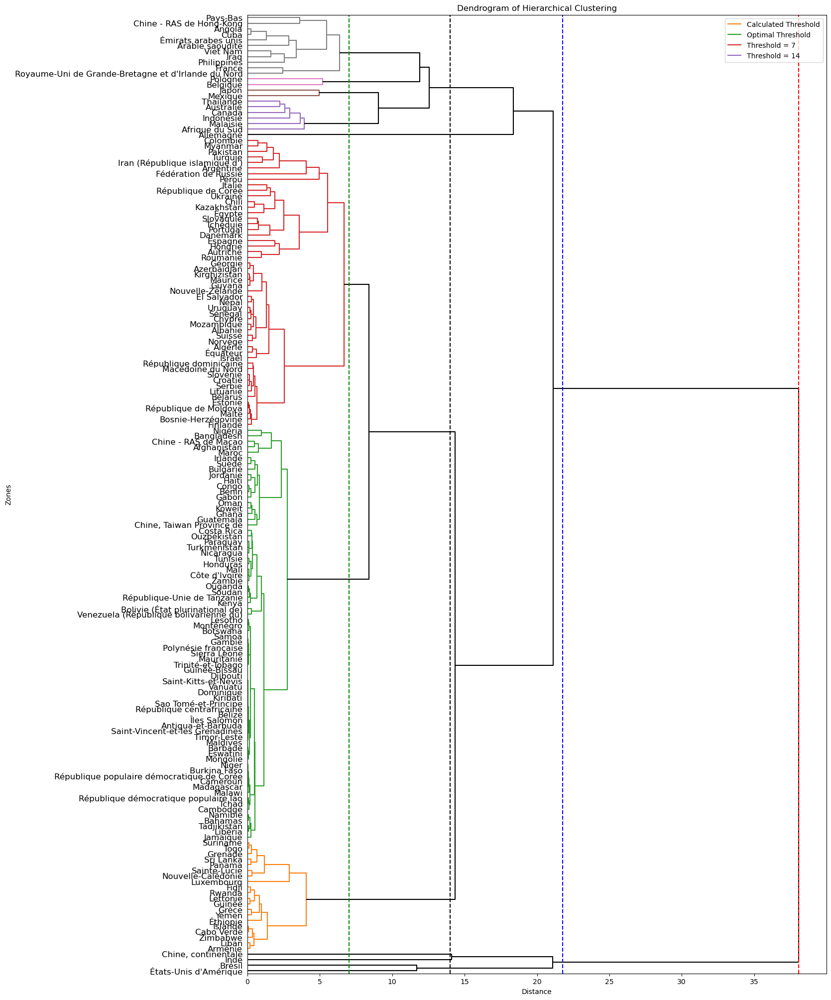

In [11]:
plt.figure(figsize=(15, 25))  # swap dimensions to suit the rotated layout
dendrogram(
    Z,
    orientation="right",              # rotate the dendrogram
    labels=df.index,
    leaf_font_size=12,
    color_threshold=7,
    above_threshold_color='black'
)
plt.title('Dendrogram of Hierarchical Clustering')
plt.xlabel('Distance')  # now the distance is on the x-axis
plt.ylabel('Zones')

# Draw a vertical line at distance=7 to indicate the cutoff for clusters
plt.axvline(x=calculated_threshold, color='red', linestyle='--')
plt.axvline(x=optimal_threshold, color='blue', linestyle='--')
plt.axvline(x=7, color='green', linestyle='--')
plt.axvline(x=14, color='black', linestyle='--')
plt.legend(['Calculated Threshold', 'Optimal Threshold', 'Threshold = 7', 'Threshold = 14'], loc='upper right')


plt.show()

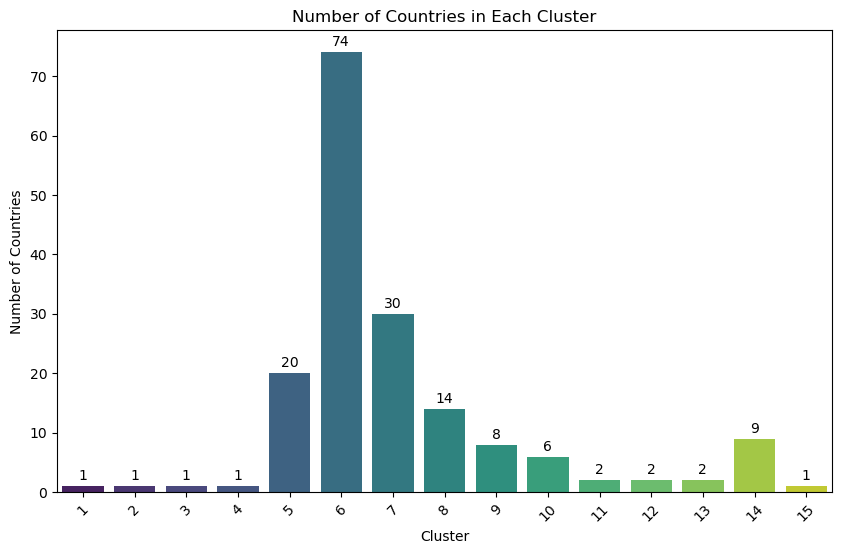

In [12]:
# plot dendrogram with 7 clusters & number of countries in each cluster
nb_clusters = 15
clusters = fcluster(Z, nb_clusters, criterion='maxclust')
# Create a DataFrame to hold the cluster labels
cluster_labels = pd.DataFrame({'Zone': df.index, 'Cluster': clusters})
# Count the number of countries in each cluster
cluster_counts = cluster_labels['Cluster'].value_counts().sort_index()
# Plot the number of countries in each cluster
plt.figure(figsize=(10, 6))
sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='viridis')
plt.title('Number of Countries in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Countries')
plt.xticks(rotation=45)
#show the number of countries in each cluster
for i, count in enumerate(cluster_counts):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom')
plt.show()

In [13]:
# show countries in each cluster
for cluster in np.unique(clusters):
    print(f"Cluster {cluster}:")
    print(df.index[clusters == cluster].tolist())
    print("\n")

Cluster 1:
["États-Unis d'Amérique"]


Cluster 2:
['Brésil']


Cluster 3:
['Inde']


Cluster 4:
['Chine, continentale']


Cluster 5:
['Zimbabwe', 'Togo', 'Guinée', 'Arménie', 'Yémen', 'Panama', 'Nouvelle-Calédonie', 'Sainte-Lucie', 'Cabo Verde', 'Éthiopie', 'Islande', 'Grenade', 'Rwanda', 'Fidji', 'Luxembourg', 'Sri Lanka', 'Liban', 'Suriname', 'Lettonie', 'Grèce']


Cluster 6:
['Ouzbékistan', 'Trinité-et-Tobago', 'Soudan', 'Ouganda', "Côte d'Ivoire", 'Afghanistan', 'Mali', 'Libéria', 'Burkina Faso', 'République populaire démocratique de Corée', 'Tadjikistan', 'Gabon', 'Madagascar', 'Cameroun', 'Malawi', 'Venezuela (République bolivarienne du)', 'Bangladesh', 'Cambodge', 'Nigéria', 'Bénin', 'Nicaragua', 'Congo', 'République-Unie de Tanzanie', 'Ghana', 'Kenya', 'Haïti', 'Antigua-et-Barbuda', 'Djibouti', 'Maldives', 'République centrafricaine', 'Îles Salomon', 'Vanuatu', 'Monténégro', 'Guinée-Bissau', 'Saint-Kitts-et-Nevis', 'Saint-Vincent-et-les Grenadines', 'Dominique', 'Timor-Leste', 

In [14]:
# add cluster labels to the original dataset
df['Cluster'] = clusters


In [15]:
#show avarage values of each cluster
average_values = df.groupby('Cluster').mean()
print("Average values of each cluster:")
print(average_values)

Average values of each cluster:
         Disponibilité intérieure_dispo  Exportations - Quantité_dispo  \
Cluster                                                                  
1                          1.826600e+10                   3.692000e+09   
2                          9.982000e+09                   4.223000e+09   
3                          3.661000e+09                   4.000000e+06   
4                          1.816100e+10                   5.760000e+08   
5                          6.470000e+07                   3.050000e+06   
6                          1.000946e+08                   3.162162e+06   
7                          1.228333e+08                   1.173333e+07   
8                          6.015000e+08                   9.985714e+07   
9                          2.065750e+09                   1.003750e+08   
10                         1.591167e+09                   1.846667e+08   
11                         3.317000e+09                   9.500000e+06   
12    

In [16]:
#show avarage values of each cluster
sum_values = df.groupby('Cluster').sum()
print("Sum values of each cluster:")
print(sum_values)


Sum values of each cluster:
         Disponibilité intérieure_dispo  Exportations - Quantité_dispo  \
Cluster                                                                  
1                          1.826600e+10                   3.692000e+09   
2                          9.982000e+09                   4.223000e+09   
3                          3.661000e+09                   4.000000e+06   
4                          1.816100e+10                   5.760000e+08   
5                          1.294000e+09                   6.100000e+07   
6                          7.407000e+09                   2.340000e+08   
7                          3.685000e+09                   3.520000e+08   
8                          8.421000e+09                   1.398000e+09   
9                          1.652600e+10                   8.030000e+08   
10                         9.547000e+09                   1.108000e+09   
11                         6.634000e+09                   1.900000e+07   
12        

### graphs

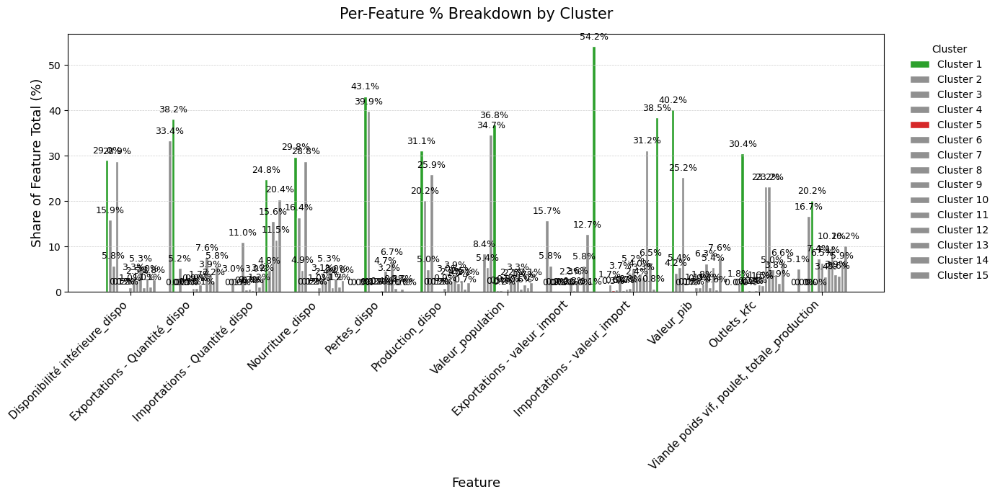

In [17]:
import numpy as np
import matplotlib.pyplot as plt

# assuming average_values is your DataFrame of cluster means
percent_by_feature = average_values.div(average_values.sum(axis=0), axis=1) * 100

clusters = percent_by_feature.index.astype(str).tolist()
features = percent_by_feature.columns.tolist()

x = np.arange(len(features))
width = 0.8 / len(clusters)

fig, ax = plt.subplots(figsize=(14, 7))
ax.grid(axis='y', color='#CCCCCC', linestyle='--', linewidth=0.5)

for i, cl in enumerate(clusters):
    vals = percent_by_feature.loc[int(cl)].values
    colors = [
        '#2ca02c' if val == percent_by_feature[f].max() else 
        '#d62728' if val == percent_by_feature[f].min() else 
        '#909090'
        for val, f in zip(vals, features)
    ]
    offsets = x + (i - (len(clusters)-1)/2) * width
    bars = ax.bar(offsets, vals, width=width, label=f'Cluster {cl}', color=colors, edgecolor='white')

    # annotate with percentage
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, height + 1, f'{height:.1f}%', 
                ha='center', va='bottom', fontsize=9)

ax.set_xticks(x)
ax.set_xticklabels(features, rotation=45, ha='right', fontsize=11)
ax.set_xlabel('Feature', fontsize=13)
ax.set_ylabel('Share of Feature Total (%)', fontsize=13)
ax.set_title('Per-Feature % Breakdown by Cluster', fontsize=15, pad=15)
ax.legend(title='Cluster', bbox_to_anchor=(1.02, 0.5), loc='center left', frameon=False)

plt.tight_layout()
plt.show()

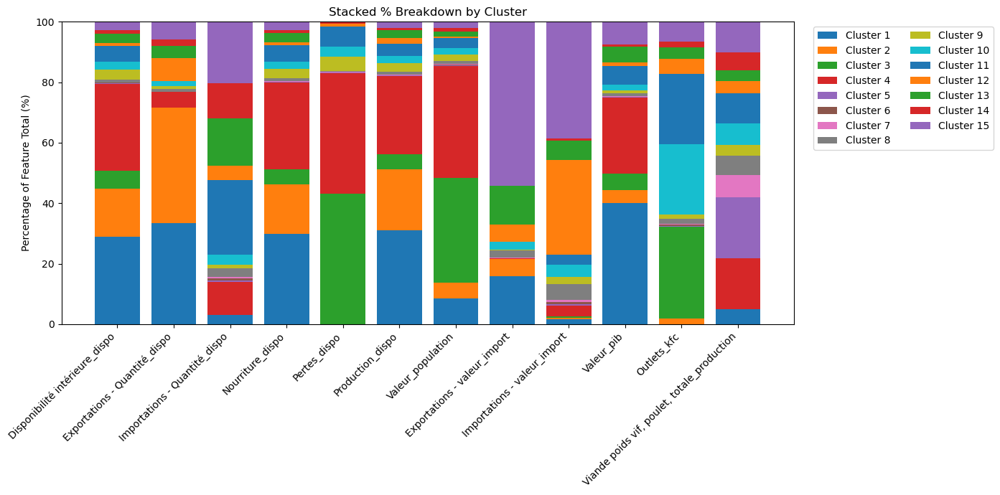

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# percent_by_feature: DataFrame, index=cluster, cols=12 features, values in %  
features = percent_by_feature.columns
clusters = percent_by_feature.index.astype(str)

fig, ax = plt.subplots(figsize=(14, 7))
bottom = np.zeros(len(features))

for cl in clusters:
    vals = percent_by_feature.loc[int(cl)].values
    ax.bar(features, vals, bottom=bottom, label=f'Cluster {cl}')
    bottom += vals

ax.set_ylabel('Percentage of Feature Total (%)')
ax.set_title('Stacked % Breakdown by Cluster')
ax.legend(ncol=2, bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

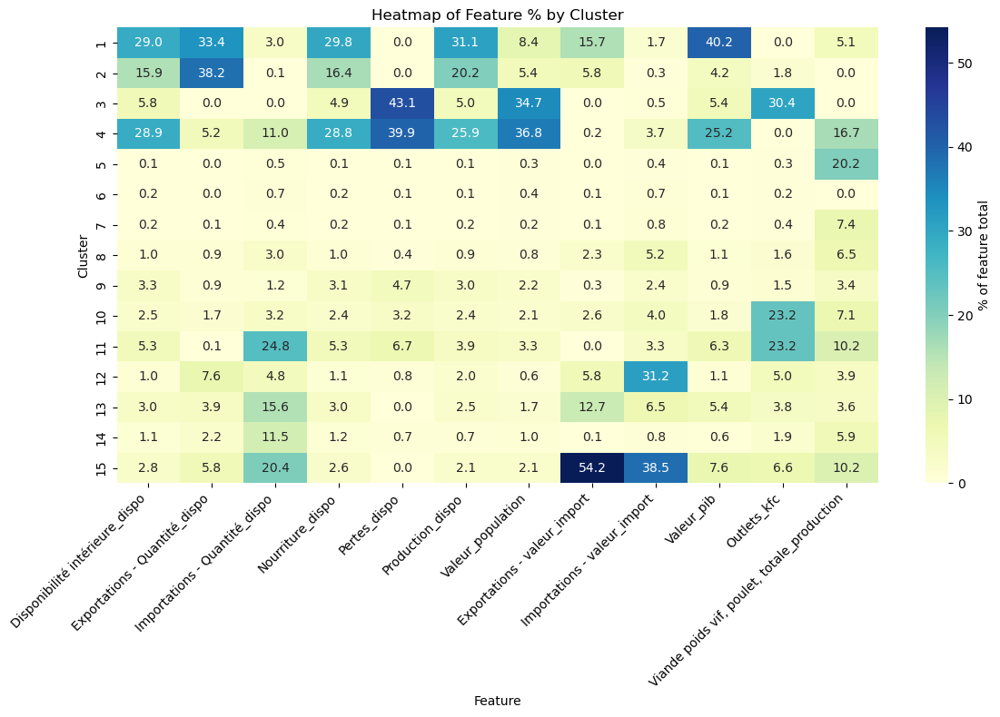

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# percent_by_feature: index=cluster, cols=features
plt.figure(figsize=(12, 8))
sns.heatmap(percent_by_feature, annot=True, fmt=".1f", cmap='YlGnBu',
            cbar_kws={'label': '% of feature total'})
plt.title('Heatmap of Feature % by Cluster')
plt.ylabel('Cluster')
plt.xlabel('Feature')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

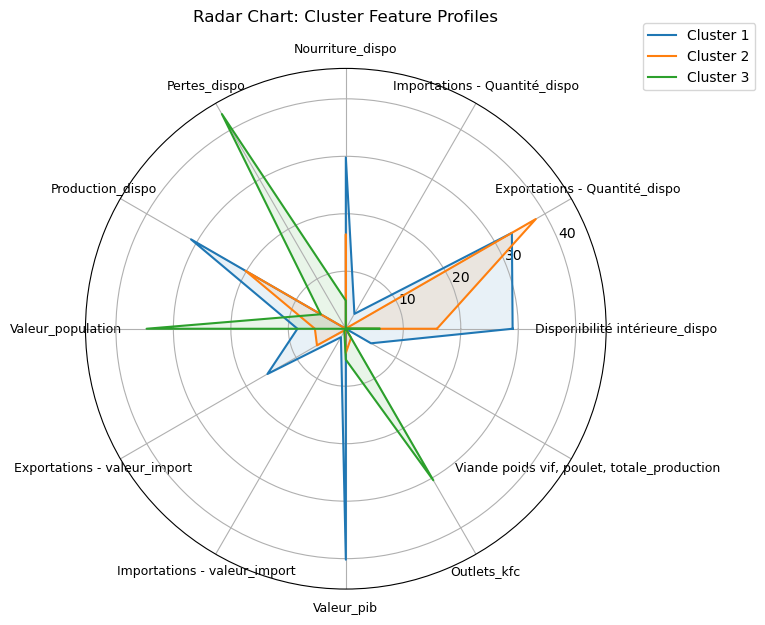

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
from math import pi

# choose clusters to plot (e.g., top 3 distinctive clusters)
to_plot = [ 1, 2, 3]  # replace with cluster IDs you want

# prepare data
df_plot = percent_by_feature.loc[to_plot]
labels = percent_by_feature.columns.tolist()
num_vars = len(labels)
angles = [n/float(num_vars)*2*pi for n in range(num_vars)]
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
for idx in df_plot.index:
    values = df_plot.loc[idx].tolist()
    values += values[:1]
    ax.plot(angles, values, label=f'Cluster {idx}')
    ax.fill(angles, values, alpha=0.1)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels, fontsize=9)
ax.set_title('Radar Chart: Cluster Feature Profiles', pad=15)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()

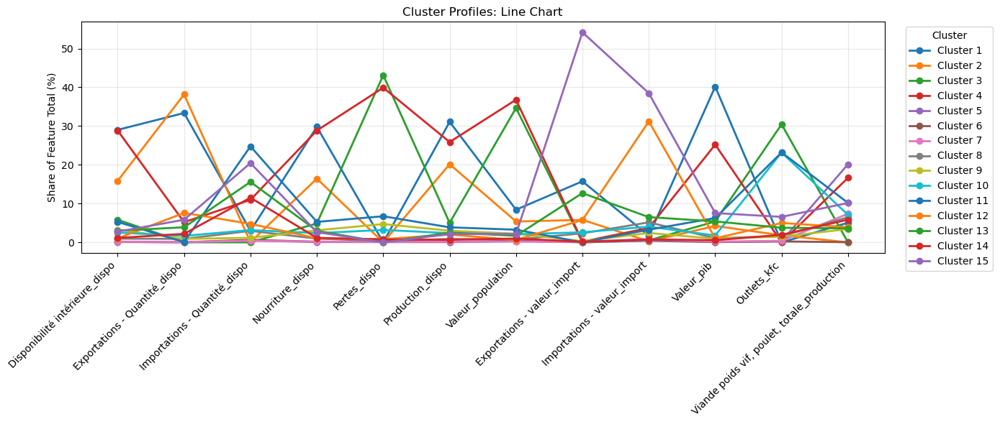

In [21]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(14, 6))
for cl in percent_by_feature.index:
    ax.plot(percent_by_feature.columns,
            percent_by_feature.loc[cl],
            marker='o', linewidth=2,
            label=f'Cluster {cl}')

ax.set_xticklabels(percent_by_feature.columns, rotation=45, ha='right')
ax.set_ylabel('Share of Feature Total (%)')
ax.set_title('Cluster Profiles: Line Chart')
ax.grid(alpha=0.3)
ax.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

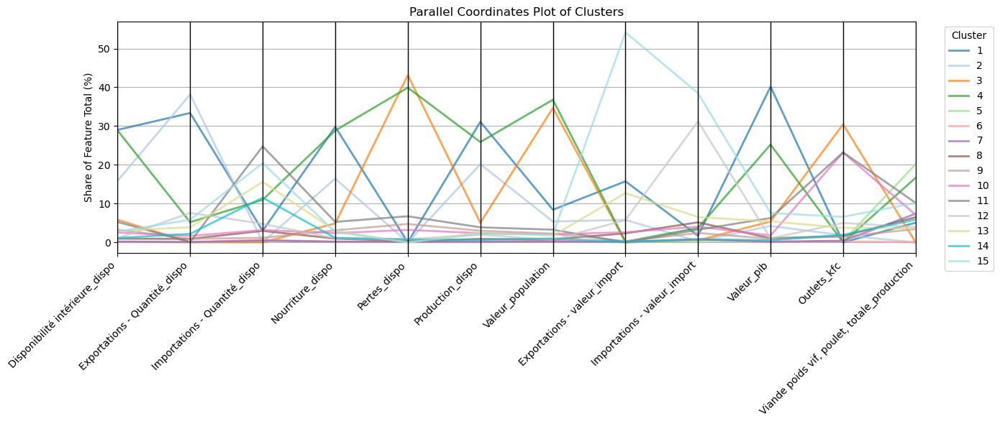

In [22]:
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# prepare DataFrame: bring cluster ID into a column
df_pc = percent_by_feature.reset_index().rename(columns={'index':'cluster'})

# Generate a color map with as many colors as clusters
num_clusters = df_pc['Cluster'].nunique()
colors = cm.get_cmap('tab20', num_clusters)  # tab20 supports up to 20, or use 'nipy_spectral' for more

plt.figure(figsize=(14, 6))
parallel_coordinates(
    df_pc, 'Cluster',
    cols=percent_by_feature.columns,
    color=[colors(i) for i in range(num_clusters)],
    linewidth=2, alpha=0.7
)

plt.xticks(rotation=45, ha='right')
plt.ylabel('Share of Feature Total (%)')
plt.title('Parallel Coordinates Plot of Clusters')
plt.legend(title='Cluster', bbox_to_anchor=(1.03, 1), loc='upper left')
plt.tight_layout()
plt.show()

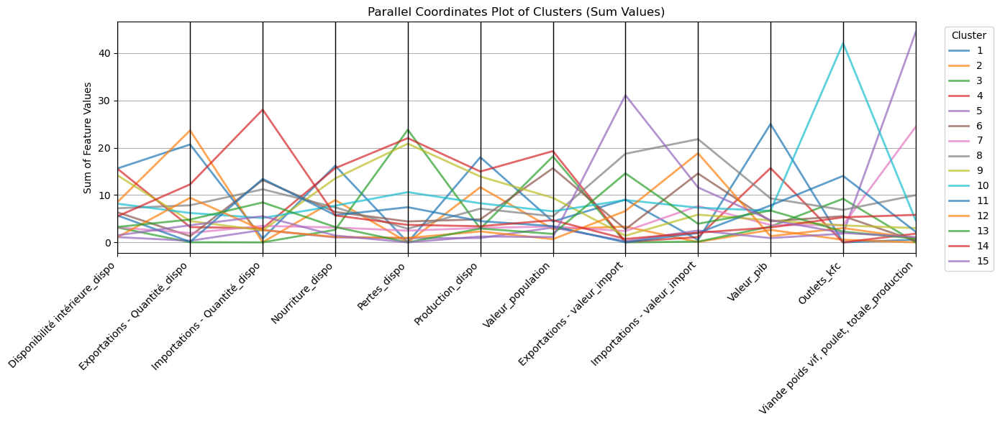

In [23]:
# show the same graph with sum values in percent_by_feature
# prepare DataFrame: bring cluster ID into a column
sum_values = sum_values.div(sum_values.sum(axis=0), axis=1) * 100


df_pc_sum = sum_values.reset_index().rename(columns={'index':'cluster'})
plt.figure(figsize=(14, 6))
parallel_coordinates(df_pc_sum, 'Cluster',
                        cols=sum_values.columns,
                        color=plt.cm.tab10.colors,
                        linewidth=2, alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Sum of Feature Values')
plt.title('Parallel Coordinates Plot of Clusters (Sum Values)')
plt.legend(title='Cluster', bbox_to_anchor=(1.03, 1), loc='upper left')
plt.tight_layout()
plt.show()


## Kmeans


  File "c:\Users\ruben\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "c:\Users\ruben\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\ruben\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\ruben\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


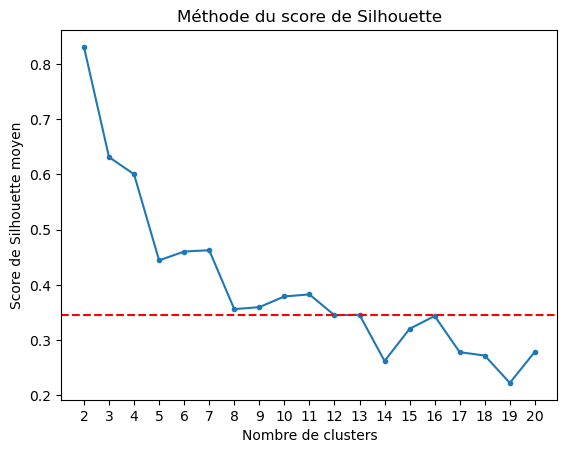

In [24]:
# Initialise les variables
n_clusters_range = range(2, 21)
silhouette_avg_scores = []

# Calcule le score de Silhouette moyen pour chaque nombre de clusters
for n_clusters in n_clusters_range:
    clustering = KMeans(n_clusters=n_clusters, n_init='auto', init='random',
                      random_state=0)
    clustering = clustering.fit(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, clustering.labels_)
    silhouette_avg_scores.append(silhouette_avg)

# Trace le graphique
fig, ax = plt.subplots()

plt.plot(n_clusters_range, silhouette_avg_scores, marker='.')
plt.axhline(y=silhouette_avg_scores[10], linestyle = '--', color='r')

# Définit la position des graduations
ax.xaxis.set_major_locator(ticker.IndexLocator(1, 0))

ax.set_xlabel('Nombre de clusters')
ax.set_ylabel('Score de Silhouette moyen')
ax.set_title('Méthode du score de Silhouette')

plt.show()

del (n_clusters_range, silhouette_avg_scores, n_clusters, clustering,
     silhouette_avg, fig, ax)

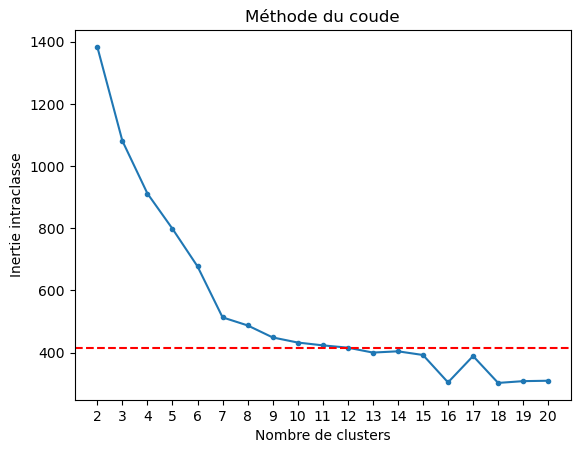

In [25]:
# Initialise les variables
n_clusters_range = range(2, 21)
inertias=[]

# Calcul l'inertie pour chaque valeur du nombre de clusters
for n_clusters in n_clusters_range:
    clustering = KMeans(n_clusters=n_clusters, n_init='auto', init='random',
                      random_state=0)
    clustering = clustering.fit(X_scaled)
    inertias.append(clustering.inertia_)

# Trace le graphique
fig, ax = plt.subplots()

plt.plot(n_clusters_range, inertias, marker='.')
plt.axhline(y=inertias[10], linestyle = '--', color='r')

# Définit la position des graduations
ax.xaxis.set_major_locator(ticker.IndexLocator(1, 0))

ax.set_xlabel('Nombre de clusters')
ax.set_ylabel('Inertie intraclasse')
ax.set_title('Méthode du coude')

plt.show()

del n_clusters_range, inertias, n_clusters, clustering, fig, ax

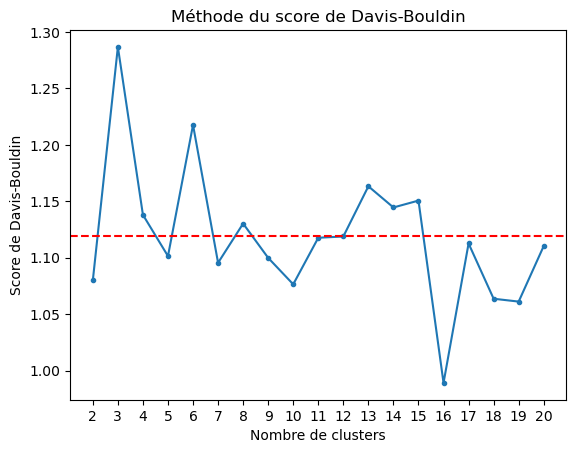

In [26]:
# indice de davis
from sklearn.metrics import davies_bouldin_score
# Initialise les variables
n_clusters_range = range(2, 21)
davis_bouldin_scores = []
# Calcule le score de Davis-Bouldin pour chaque nombre de clusters
for n_clusters in n_clusters_range:
    clustering = KMeans(n_clusters=n_clusters, n_init='auto', init='random',
                      random_state=0)
    clustering = clustering.fit(X_scaled)
    davis_bouldin = davies_bouldin_score(X_scaled, clustering.labels_)
    davis_bouldin_scores.append(davis_bouldin)
# Trace le graphique
fig, ax = plt.subplots()
plt.plot(n_clusters_range, davis_bouldin_scores, marker='.')
plt.axhline(y=davis_bouldin_scores[10], linestyle = '--', color='r')
# Définit la position des graduations
ax.xaxis.set_major_locator(ticker.IndexLocator(1, 0))
ax.set_xlabel('Nombre de clusters')
ax.set_ylabel('Score de Davis-Bouldin')
ax.set_title('Méthode du score de Davis-Bouldin')
plt.show()


In [27]:
# identification des clusters
clusters = fcluster(Z, t=12, criterion='maxclust')
# affichage des pays selon les clusters
df_clusters = pd.DataFrame({'Zone': df.index, 'Cluster_x': clusters})

In [28]:
df_groupes_cah = pd.merge(df, df_clusters, on='Zone')

In [29]:
df = df_groupes_cah.copy()

In [30]:
df_groupes_cah.head(5)

,Zone,Disponibilité intérieure_dispo,Exportations - Quantité_dispo,Importations - Quantité_dispo,Nourriture_dispo,Pertes_dispo,Production_dispo,Valeur_population,Exportations - valeur_import,Importations - valeur_import,Valeur_pib,Outlets_kfc,"Viande poids vif, poulet, totale_production",Cluster,Cluster_x
0,Ouzbékistan,0.0,0.0,0.0,0.0,0.0,0.0,31959785.0,0.0,9154000.0,6.208132e+10,27.0,0.00000,6,6
1,Sénégal,77000000.0,0.0,0.0,73000000.0,4000000.0,77000000.0,15419355.0,129000.0,716000.0,2.099657e+10,3.0,1.38685,7,7
2,Zimbabwe,76000000.0,0.0,6000000.0,67000000.0,3000000.0,69000000.0,14236595.0,653000.0,2064000.0,2.204065e+10,10.0,2.00000,5,5
3,Trinité-et-Tobago,76000000.0,0.0,23000000.0,75000000.0,0.0,61000000.0,1384059.0,0.0,642000.0,2.404021e+10,0.0,0.00000,6,6
4,Soudan,69000000.0,0.0,2000000.0,65000000.0,3000000.0,67000000.0,40813397.0,0.0,3087000.0,1.220727e+11,8.0,0.00000,6,6


In [31]:
#drop zone column
df_kmeans = df_groupes_cah.drop(columns=['Zone'])


In [32]:
#show avarage values of each cluster
average_values_kmeans = df_kmeans.groupby('Cluster_x').mean()
print("Average values of each cluster:")
print(average_values_kmeans)

Average values of each cluster:
           Disponibilité intérieure_dispo  Exportations - Quantité_dispo  \
Cluster_x                                                                  
1                            1.826600e+10                   3.692000e+09   
2                            9.982000e+09                   4.223000e+09   
3                            3.661000e+09                   4.000000e+06   
4                            1.816100e+10                   5.760000e+08   
5                            6.470000e+07                   3.050000e+06   
6                            1.000946e+08                   3.162162e+06   
7                            5.506154e+08                   4.909615e+07   
8                            1.591167e+09                   1.846667e+08   
9                            3.317000e+09                   9.500000e+06   
10                           6.540000e+08                   8.405000e+08   
11                           9.327273e+08               

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


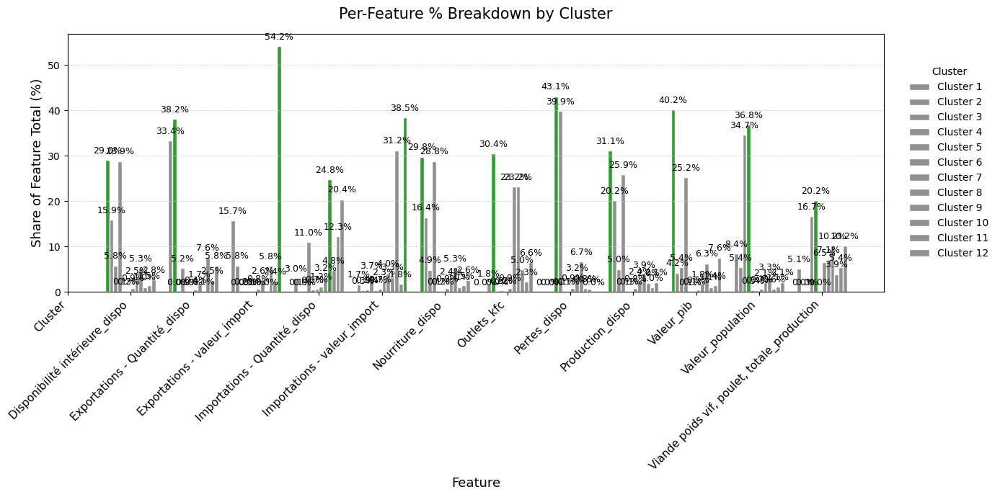

In [33]:
# assuming average_values is your DataFrame of cluster means
percent_by_feature = average_values_kmeans.div(average_values.sum(axis=0), axis=1) * 100

clusters = percent_by_feature.index.astype(str).tolist()
features = percent_by_feature.columns.tolist()

x = np.arange(len(features))
width = 0.8 / len(clusters)

fig, ax = plt.subplots(figsize=(14, 7))
ax.grid(axis='y', color='#CCCCCC', linestyle='--', linewidth=0.5)

for i, cl in enumerate(clusters):
    vals = percent_by_feature.loc[int(cl)].values
    colors = [
        '#2ca02c' if val == percent_by_feature[f].max() else 
        '#d62728' if val == percent_by_feature[f].min() else 
        '#909090'
        for val, f in zip(vals, features)
    ]
    offsets = x + (i - (len(clusters)-1)/2) * width
    bars = ax.bar(offsets, vals, width=width, label=f'Cluster {cl}', color=colors, edgecolor='white')

    # annotate with percentage
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, height + 1, f'{height:.1f}%', 
                ha='center', va='bottom', fontsize=9)

ax.set_xticks(x)
ax.set_xticklabels(features, rotation=45, ha='right', fontsize=11)
ax.set_xlabel('Feature', fontsize=13)
ax.set_ylabel('Share of Feature Total (%)', fontsize=13)
ax.set_title('Per-Feature % Breakdown by Cluster', fontsize=15, pad=15)
ax.legend(title='Cluster', bbox_to_anchor=(1.02, 0.5), loc='center left', frameon=False)

plt.tight_layout()
plt.show()

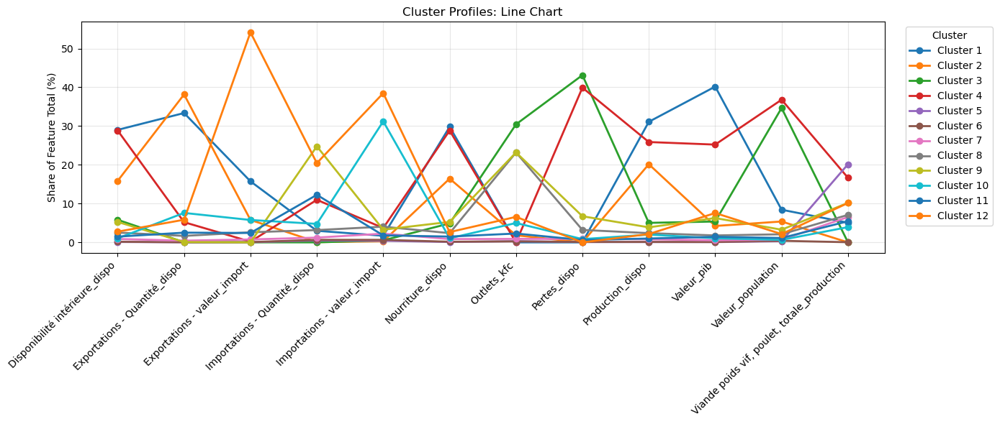

In [34]:
fig, ax = plt.subplots(figsize=(14, 6))
for cl in percent_by_feature.index:
    ax.plot(percent_by_feature.columns,
            percent_by_feature.loc[cl],
            marker='o', linewidth=2,
            label=f'Cluster {cl}')

ax.set_xticklabels(percent_by_feature.columns, rotation=45, ha='right')
ax.set_ylabel('Share of Feature Total (%)')
ax.set_title('Cluster Profiles: Line Chart')
ax.grid(alpha=0.3)
ax.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [35]:
# analyse des centroids
centroids = pd.DataFrame(df_kmeans.groupby('Cluster_x').mean().values,
                        columns=df_kmeans.columns[:-1],
                        index=df_kmeans['Cluster_x'].unique())
centroids = centroids.sort_index()
centroids = centroids.div(centroids.sum(axis=0), axis=1) * 100
centroids = centroids.reset_index().rename(columns={'index': 'Cluster_x'})
centroids

,Cluster_x,Disponibilité intérieure_dispo,Exportations - Quantité_dispo,Importations - Quantité_dispo,Nourriture_dispo,Pertes_dispo,Production_dispo,Valeur_population,Exportations - valeur_import,Importations - valeur_import,Valeur_pib,Outlets_kfc,"Viande poids vif, poulet, totale_production",Cluster
0,1,1.580377,2.636935,14.982620,1.588705,0.637859,1.051877,1.170945,2.769887,2.038284,1.535952,2.424431,6.391108,15.286427
1,2,2.946494,6.147658,24.985421,2.820311,0.000000,2.272403,2.232166,61.883283,43.561429,8.058641,6.999329,11.914418,16.593819
2,3,0.169596,0.030093,0.804002,0.169907,0.113254,0.120277,0.421148,0.074352,0.737786,0.102745,0.263175,0.044751,6.637528
3,4,2.696011,1.757380,3.872444,2.529632,3.356636,2.515053,2.175192,2.965957,4.582037,1.905080,24.681274,8.319084,11.062546
4,5,6.203055,0.038066,0.000000,5.197154,45.152164,5.320786,36.150571,0.014186,0.581616,5.729989,32.404299,0.000000,3.318764
5,6,30.949196,35.134915,3.649889,31.726305,0.000000,32.891314,8.778818,17.985176,1.928979,42.821276,0.000000,5.943852,1.106255
6,7,16.913110,40.188176,0.089022,17.496794,0.000000,21.314664,5.612491,6.618537,0.320372,4.505501,1.944258,0.000000,2.212509
7,8,30.771288,5.481504,13.412601,30.706155,41.773872,27.370904,38.374274,0.211283,4.193619,26.878864,0.000000,19.535312,4.425018
8,9,0.932941,0.467224,1.497390,0.904968,0.955767,0.846783,0.699171,0.860934,2.549576,0.579835,0.952811,7.659633,8.382006
9,10,1.108112,7.998618,5.830921,1.134084,0.877056,2.111804,0.666651,6.590116,35.336739,1.121625,5.314305,4.606423,13.275055


In [36]:
import plotly.graph_objects as go

# Extract category labels for the theta axis
categories = centroids.columns[1:].tolist()

# Create the polar chart
fig = go.Figure()

# Add a trace for each cluster centroid (assuming each row in centroids is a cluster)
for i in range(12):
    fig.add_trace(go.Scatterpolar(
        r=centroids.iloc[i, 1:],  # Skip the first column if it's an index or label
        theta=categories,
        fill='toself',
        name=f'Cluster {i+1} centroide'
    ))

# Update visual settings
fig.update_traces(opacity=0.5, selector=dict(type='scatterpolar'))
fig.update_layout(
    polar=dict(
        radialaxis=dict(visible=True, range=[0, centroids.iloc[:, 1:].max().max()])
    ),
    showlegend=True
)

# Show the figure
fig.show()

Average values of each cluster (K-medoids):
                  Disponibilité intérieure_dispo  \
Cluster_kmedoids                                   
0                                   1.520000e+08   
1                                   1.386375e+09   
2                                   1.739000e+09   
3                                   1.073590e+08   
4                                   9.982000e+09   
5                                   1.826600e+10   
6                                   2.132564e+08   
7                                   3.661000e+09   
8                                   1.783917e+09   
9                                   1.249048e+08   
10                                  1.639750e+09   
11                                  1.816100e+10   

                  Exportations - Quantité_dispo  \
Cluster_kmedoids                                  
0                                  6.560000e+08   
1                                  3.817500e+08   
2                      

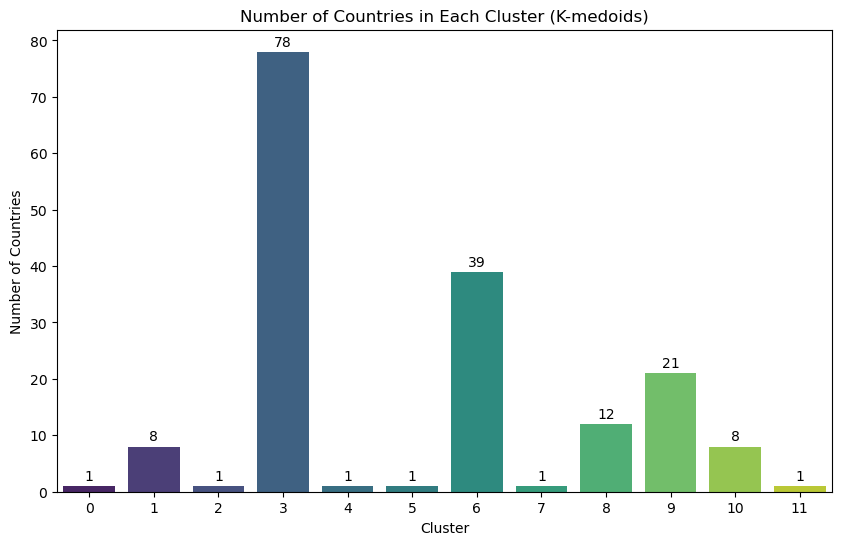

Cluster 0:
[165]


Cluster 1:
[27, 123, 125, 149, 160, 162, 166, 169]


Cluster 2:
[164]


Cluster 3:
[0, 3, 4, 6, 7, 9, 11, 12, 17, 18, 19, 20, 21, 22, 23, 26, 28, 30, 32, 33, 35, 37, 38, 41, 42, 44, 45, 46, 47, 48, 50, 53, 54, 55, 56, 60, 61, 62, 63, 65, 66, 67, 68, 69, 70, 71, 72, 73, 75, 76, 77, 78, 79, 80, 81, 82, 86, 87, 88, 90, 91, 92, 96, 98, 99, 106, 107, 108, 112, 119, 121, 124, 129, 130, 134, 143, 148, 153]


Cluster 4:
[171]


Cluster 5:
[170]


Cluster 6:
[1, 5, 8, 13, 14, 15, 29, 31, 39, 40, 43, 49, 74, 85, 89, 97, 100, 104, 105, 110, 114, 117, 118, 120, 122, 127, 128, 131, 133, 135, 136, 138, 141, 145, 146, 150, 152, 155, 157]


Cluster 7:
[109]


Cluster 8:
[25, 95, 101, 103, 111, 116, 142, 151, 156, 158, 159, 161]


Cluster 9:
[2, 10, 16, 34, 36, 51, 52, 57, 58, 59, 64, 83, 84, 93, 94, 102, 113, 115, 132, 137, 147]


Cluster 10:
[24, 126, 139, 140, 144, 154, 167, 168]


Cluster 11:
[163]




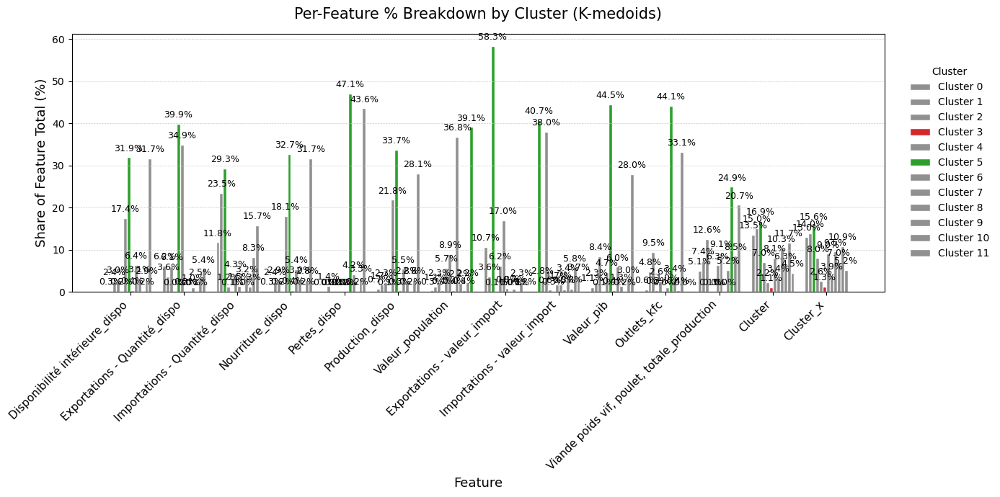

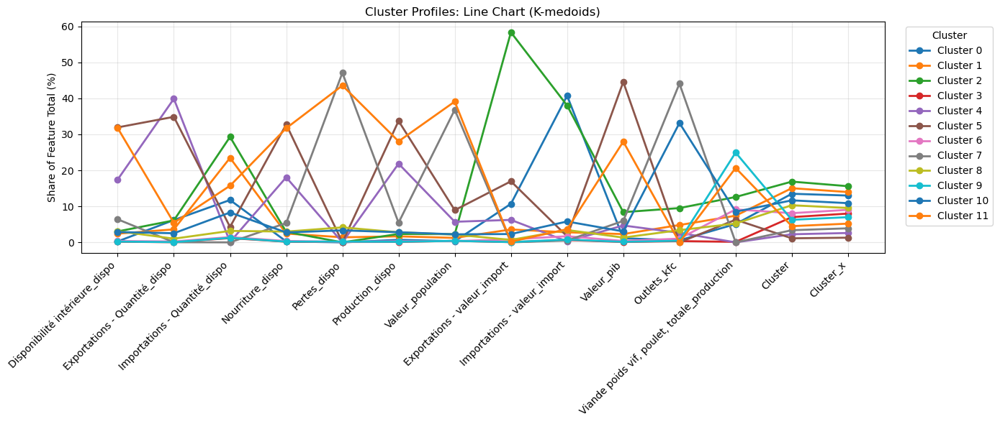

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import calculate_distance_matrix
import plotly.graph_objects as go



# 🧪 Initialize medoids and distance matrix
initial_medoids = np.random.choice(len(X_scaled), 12, replace=False).tolist()
distance_matrix = calculate_distance_matrix(X_scaled.tolist())

# 🔹 K-Medoids clustering
kmedoids_instance = kmedoids(distance_matrix, initial_medoids, data_type='distance_matrix')
kmedoids_instance.process()
clusters = kmedoids_instance.get_clusters()
medoids = kmedoids_instance.get_medoids()

# 🏷 Assign labels to each observation
labels = np.empty(len(X_scaled), dtype=int)
for cluster_id, cluster in enumerate(clusters):
    for index in cluster:
        labels[index] = cluster_id

df['Cluster_kmedoids'] = labels
# drop the 'Zone' column
df_kmedoids = df.drop(columns=['Zone'])


# 📊 Average values by cluster
average_values_kmedoids = df_kmedoids.groupby('Cluster_kmedoids').mean()
print("Average values of each cluster (K-medoids):")
print(average_values_kmedoids)

# 📈 Number of countries per cluster
cluster_counts_kmedoids = df['Cluster_kmedoids'].value_counts().sort_index()
plt.figure(figsize=(10, 6))
sns.barplot(x=cluster_counts_kmedoids.index, y=cluster_counts_kmedoids.values, palette='viridis')
plt.title('Number of Countries in Each Cluster (K-medoids)')
plt.xlabel('Cluster')
plt.ylabel('Number of Countries')
for i, count in enumerate(cluster_counts_kmedoids):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom')
plt.show()

# 🌍 Show countries in each cluster
for cluster in np.unique(labels):
    print(f"Cluster {cluster}:")
    print(df.index[labels == cluster].tolist())
    print("\n")

# 🔬 Feature contribution by cluster
average_values = df_kmedoids.drop(columns=['Cluster_kmedoids']).mean()
percent_by_feature_kmedoids = average_values_kmedoids.div(average_values_kmedoids.sum(axis=0), axis=1) * 100
clusters_kmedoids = percent_by_feature_kmedoids.index.astype(str).tolist()
features_kmedoids = percent_by_feature_kmedoids.columns.tolist()

x_kmedoids = np.arange(len(features_kmedoids))
width_kmedoids = 0.8 / len(clusters_kmedoids)
fig, ax = plt.subplots(figsize=(14, 7))
ax.grid(axis='y', color='#CCCCCC', linestyle='--', linewidth=0.5)

for i, cl in enumerate(clusters_kmedoids):
    vals = percent_by_feature_kmedoids.loc[int(cl)].values
    colors = [
        '#2ca02c' if val == percent_by_feature_kmedoids[f].max() else
        '#d62728' if val == percent_by_feature_kmedoids[f].min() else
        '#909090'
        for val, f in zip(vals, features_kmedoids)
    ]
    offsets = x_kmedoids + (i - (len(clusters_kmedoids)-1)/2) * width_kmedoids
    bars = ax.bar(offsets, vals, width=width_kmedoids, label=f'Cluster {cl}', color=colors, edgecolor='white')
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, height + 1, f'{height:.1f}%', ha='center', va='bottom', fontsize=9)

ax.set_xticks(x_kmedoids)
ax.set_xticklabels(features_kmedoids, rotation=45, ha='right', fontsize=11)
ax.set_xlabel('Feature', fontsize=13)
ax.set_ylabel('Share of Feature Total (%)', fontsize=13)
ax.set_title('Per-Feature % Breakdown by Cluster (K-medoids)', fontsize=15, pad=15)
ax.legend(title='Cluster', bbox_to_anchor=(1.02, 0.5), loc='center left', frameon=False)
plt.tight_layout()
plt.show()

# 📉 Line chart comparison
fig, ax = plt.subplots(figsize=(14, 6))
for cl in percent_by_feature_kmedoids.index:
    ax.plot(
        percent_by_feature_kmedoids.columns,
        percent_by_feature_kmedoids.loc[cl],
        marker='o', linewidth=2, label=f'Cluster {cl}'
    )
ax.set_xticklabels(percent_by_feature_kmedoids.columns, rotation=45, ha='right')
ax.set_ylabel('Share of Feature Total (%)')
ax.set_title('Cluster Profiles: Line Chart (K-medoids)')
ax.grid(alpha=0.3)
ax.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 🌐 Radar plot of centroids

centroids_kmedoids = df_kmedoids.groupby('Cluster_kmedoids').mean()
centroids_kmedoids = centroids_kmedoids.div(centroids_kmedoids.sum(axis=0), axis=1) * 100
centroids_kmedoids = centroids_kmedoids.reset_index()
categories_kmedoids = centroids_kmedoids.columns[1:].tolist()

fig_kmedoids = go.Figure()
for i in range(12):
    fig_kmedoids.add_trace(go.Scatterpolar(
        r=centroids_kmedoids.iloc[i, 1:],
        theta=categories_kmedoids,
        fill='toself',
        name=f'Cluster {i} centroide'
    ))

fig_kmedoids.update_traces(opacity=0.5, selector=dict(type='scatterpolar'))
fig_kmedoids.update_layout(
    polar=dict(radialaxis=dict(visible=True, range=[0, centroids_kmedoids.iloc[:, 1:].max().max()])),
    showlegend=True
)
fig_kmedoids.show()

## PCA

In [38]:
df.head(5)


,Zone,Disponibilité intérieure_dispo,Exportations - Quantité_dispo,Importations - Quantité_dispo,Nourriture_dispo,Pertes_dispo,Production_dispo,Valeur_population,Exportations - valeur_import,Importations - valeur_import,Valeur_pib,Outlets_kfc,"Viande poids vif, poulet, totale_production",Cluster,Cluster_x,Cluster_kmedoids
0,Ouzbékistan,0.0,0.0,0.0,0.0,0.0,0.0,31959785.0,0.0,9154000.0,6.208132e+10,27.0,0.00000,6,6,3
1,Sénégal,77000000.0,0.0,0.0,73000000.0,4000000.0,77000000.0,15419355.0,129000.0,716000.0,2.099657e+10,3.0,1.38685,7,7,6
2,Zimbabwe,76000000.0,0.0,6000000.0,67000000.0,3000000.0,69000000.0,14236595.0,653000.0,2064000.0,2.204065e+10,10.0,2.00000,5,5,9
3,Trinité-et-Tobago,76000000.0,0.0,23000000.0,75000000.0,0.0,61000000.0,1384059.0,0.0,642000.0,2.404021e+10,0.0,0.00000,6,6,3
4,Soudan,69000000.0,0.0,2000000.0,65000000.0,3000000.0,67000000.0,40813397.0,0.0,3087000.0,1.220727e+11,8.0,0.00000,6,6,3


In [39]:
features = df.columns[:-1]  # Exclude the 'Cluster' column

In [40]:
X_scaled

array([[-0.31328323, -0.22715699, -0.47758329, ..., -0.21327647,
        -0.19655942, -0.73334081],
       [-0.27778757, -0.22715699, -0.47758329, ..., -0.23552284,
        -0.32728236,  0.89160192],
       [-0.27824856, -0.22715699, -0.4452005 , ..., -0.23495749,
        -0.28915483,  1.61001677],
       ...,
       [-0.14179771,  2.87750428,  2.80387203, ..., -0.24689196,
         0.10301398, -0.73334081],
       [ 8.1070248 ,  7.85634752,  0.18626376, ..., 10.37257148,
        -0.34362272, -0.02945478],
       [ 4.288245  ,  9.0189534 , -0.4613919 , ...,  0.87044982,
        -0.01681538, -0.73334081]])

In [41]:
# Get min(n_samples, n_features)
components = min(X_scaled.shape[0], X_scaled.shape[1])

# Initialize and apply PCA
pca = PCA(n_components=components)
X_pca = pca.fit_transform(X_scaled)


In [42]:
components

12

In [43]:
# Number of principal components
print("Number of principal components:", pca.n_components_)
print("Shape of pca.components_:", pca.components_.shape)

Number of principal components: 12
Shape of pca.components_: (12, 12)


In [44]:
# create data
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
a_list = range(1, components+1)
list(a_list)
    

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

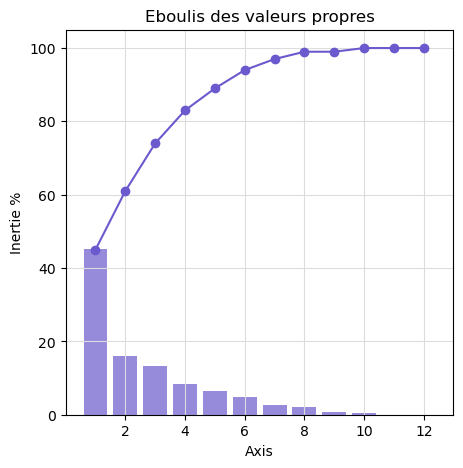

In [45]:
# plot data
plt.figure(figsize=(5,5))
plt.bar(a_list, scree, color='slateblue', alpha=0.7, label='Inertie')
plt.plot(a_list, scree_cum,color='slateblue',marker='o')
plt.xlabel("Axis")
plt.ylabel("Inertie %")
plt.title("Eboulis des valeurs propres")
plt.grid(axis='both', color='gainsboro')
plt.savefig("eboulis.png", bbox_inches='tight')
plt.show(block=False)


In [46]:
# drop zone column
df_pca = df.drop(columns=['Zone', 'Cluster_x', 'Cluster_kmedoids'])

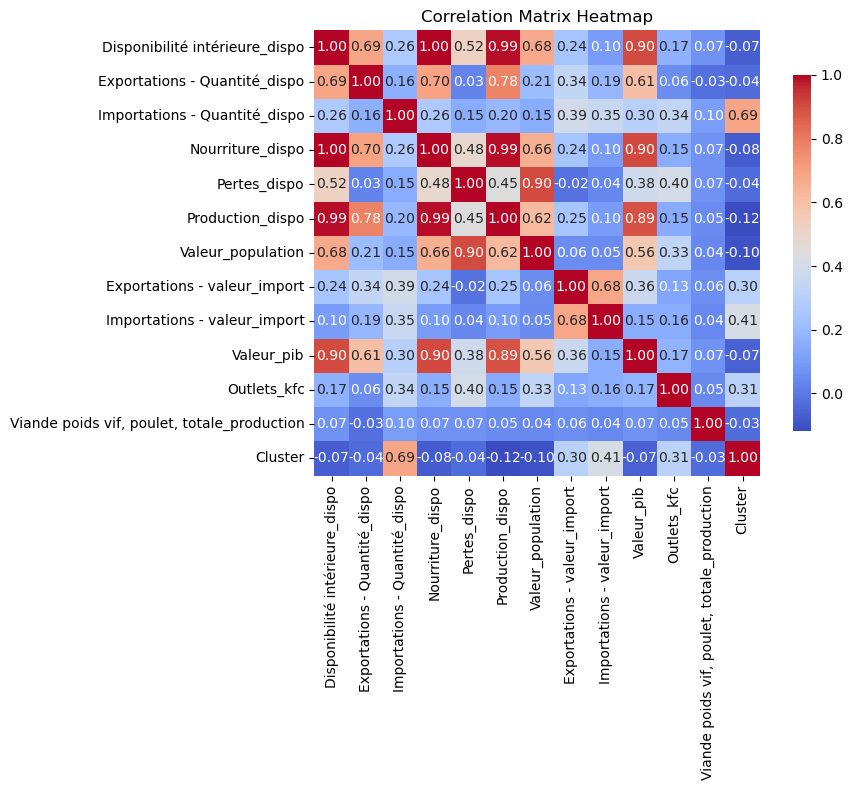

In [47]:
# heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(df_pca.corr(), annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix Heatmap')
plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Correlation Matrix Heatmap')

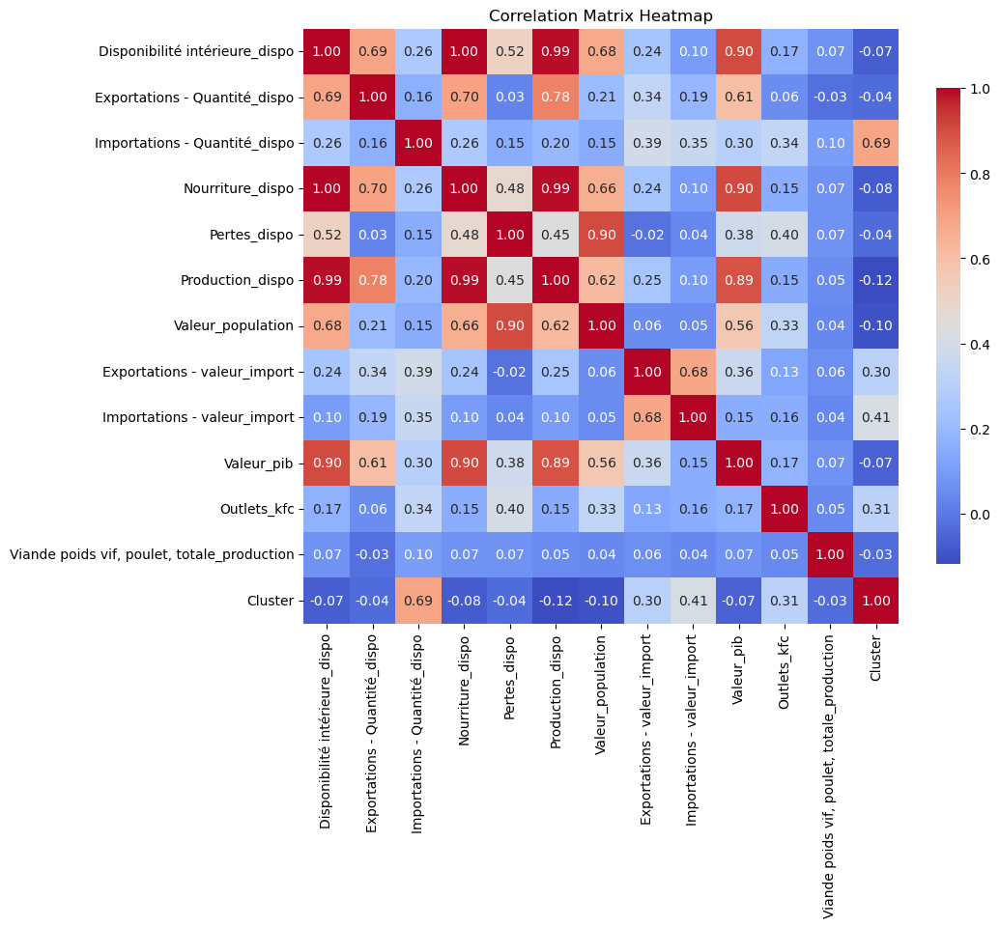

In [48]:
#draw correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(df_pca.corr(), annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix Heatmap') 

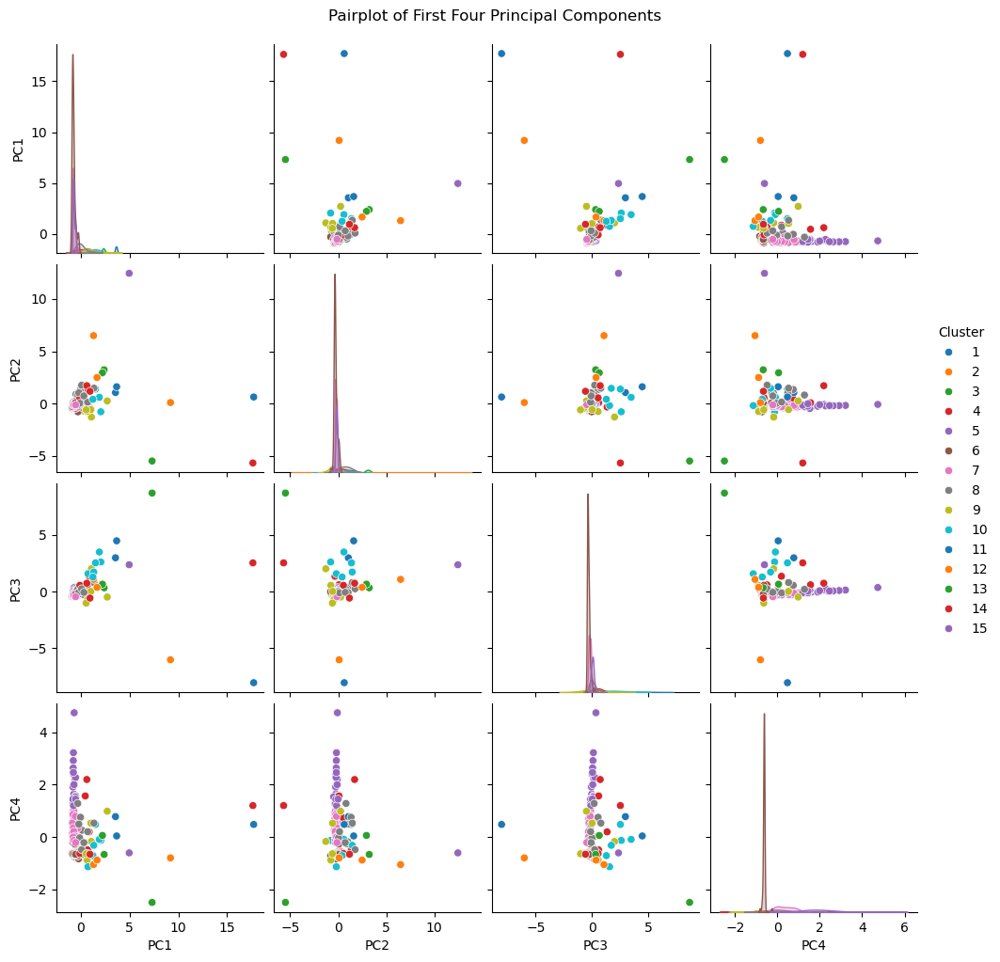

In [49]:
import pandas as pd
import seaborn as sns

df_pca_plot = pd.DataFrame(X_pca[:, :4], columns=['PC1', 'PC2', 'PC3', 'PC4'])
df_pca_plot['Cluster'] = df['Cluster'].values
sns.pairplot(df_pca_plot, hue='Cluster', palette='tab10')
plt.suptitle('Pairplot of First Four Principal Components', y=1.02)
plt.show()

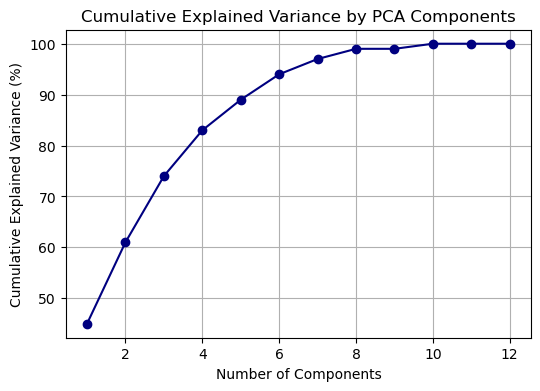

In [50]:
# Cumulative explained variance plot
plt.figure(figsize=(6,4))
plt.plot(range(1, len(scree_cum)+1), scree_cum, marker='o', color='navy')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.title('Cumulative Explained Variance by PCA Components')
plt.grid(True)
plt.show()

### correlation circles with 12 components

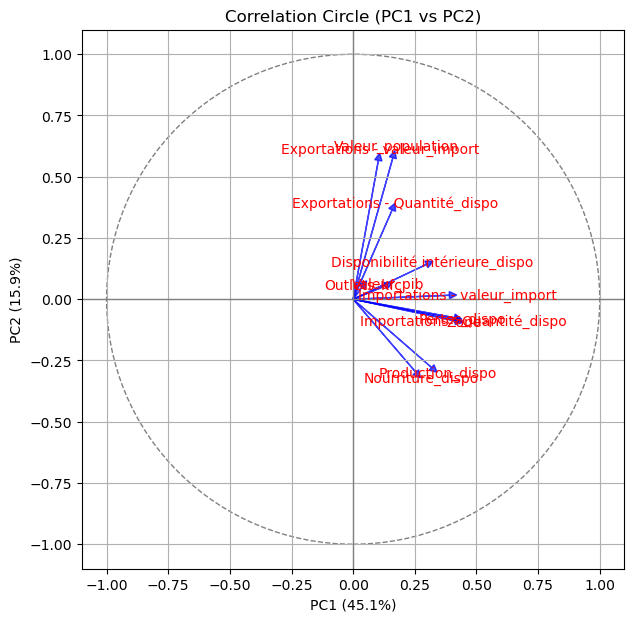

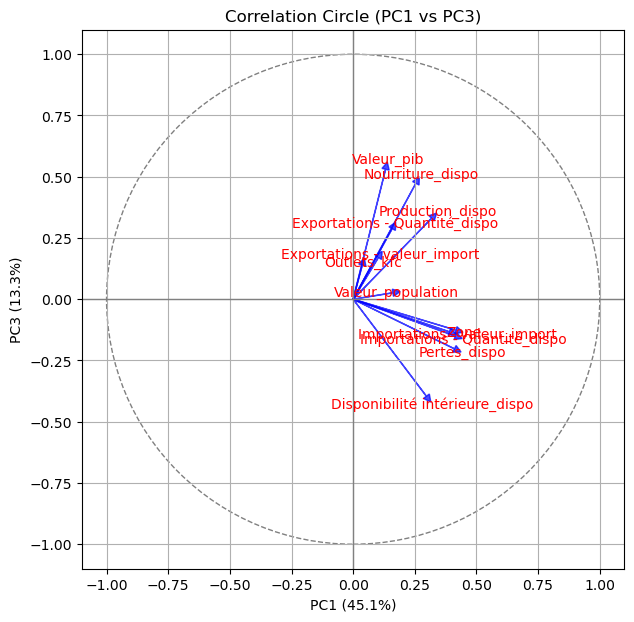

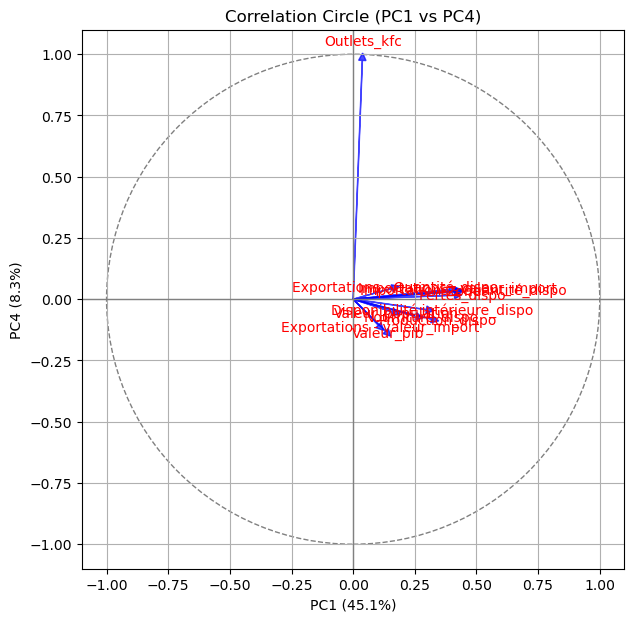

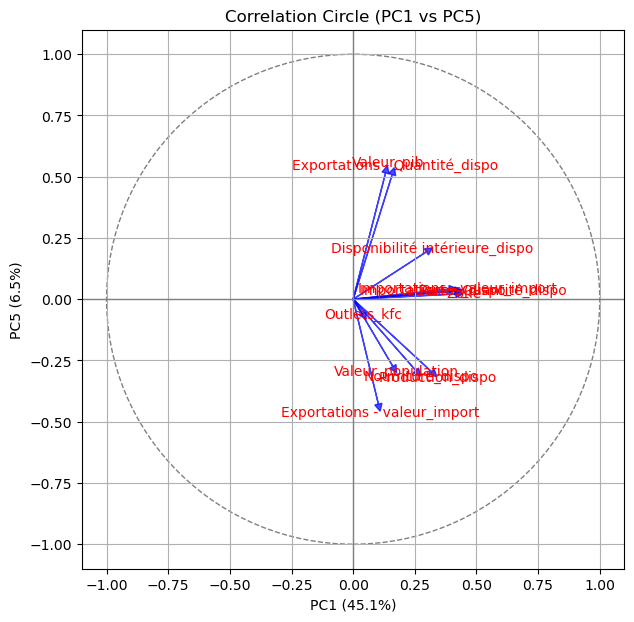

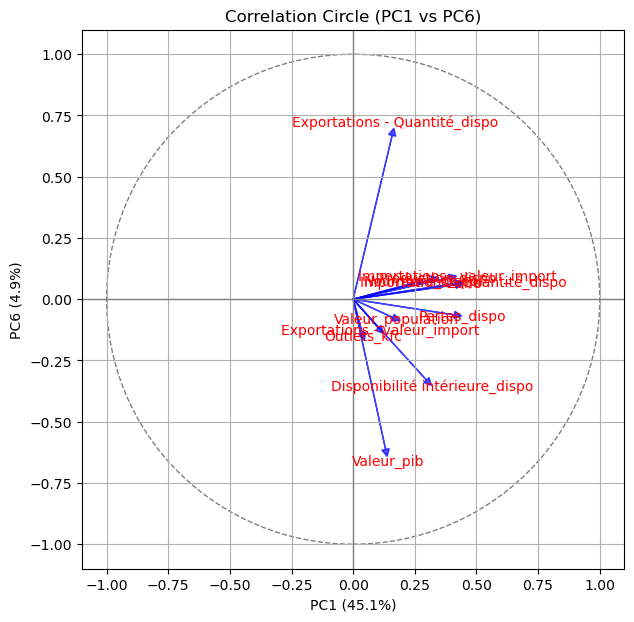

...

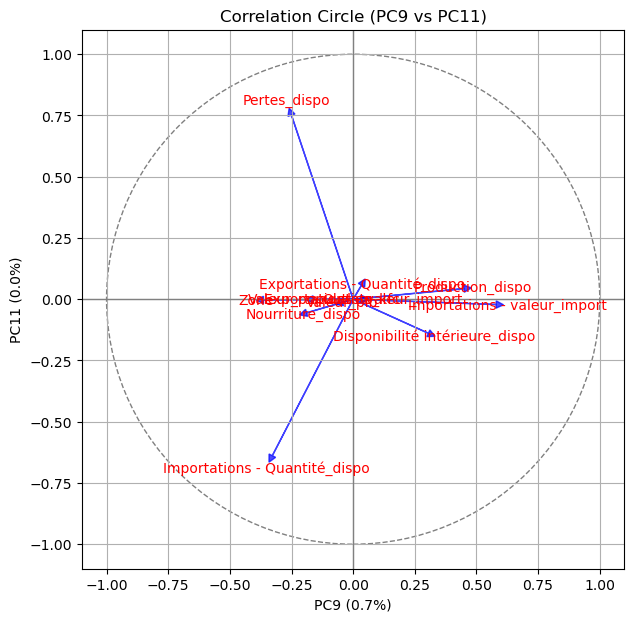

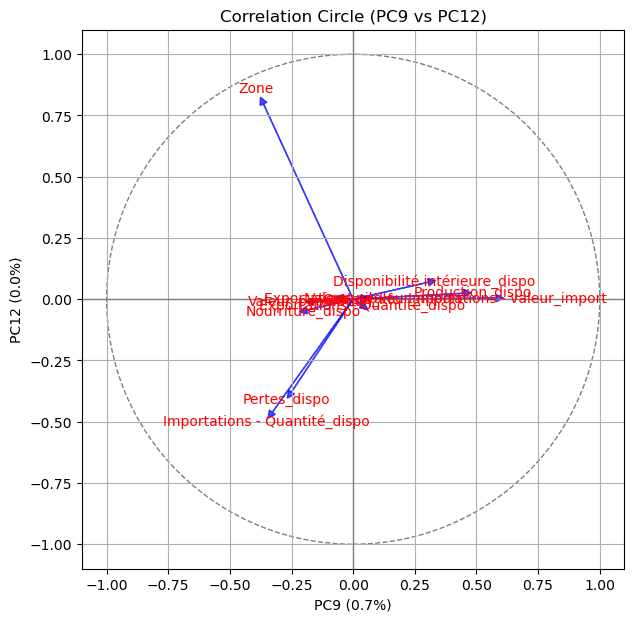

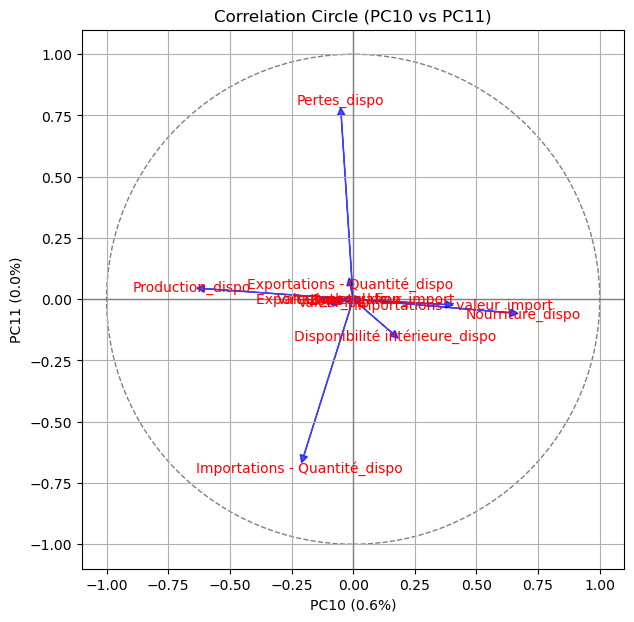

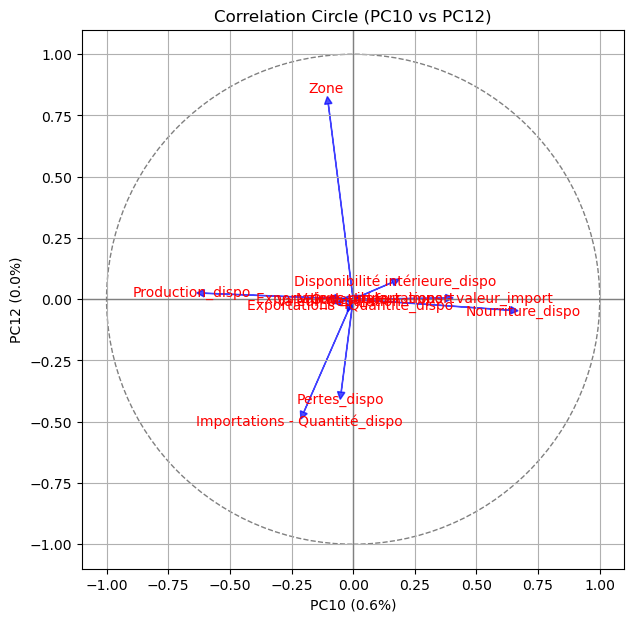

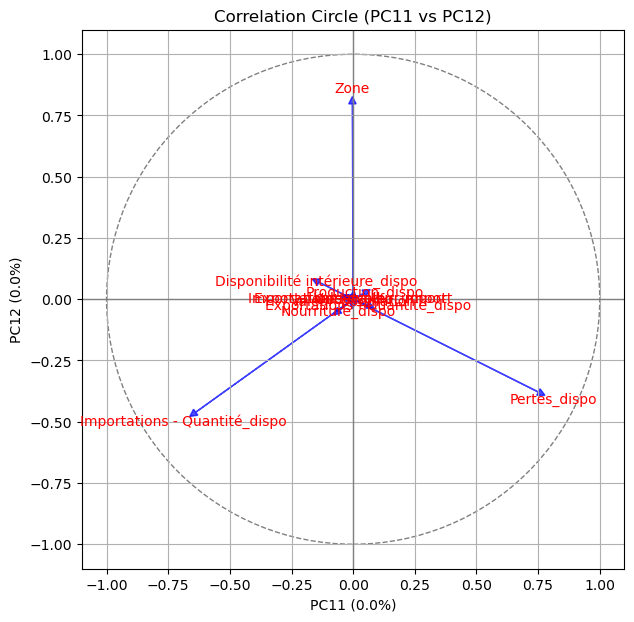

In [51]:
import matplotlib.pyplot as plt
import numpy as np

def plot_correlation_circle(pca, features, pcx=1, pcy=2):
    pcs = pca.components_
    plt.figure(figsize=(7,7))
    circle = plt.Circle((0,0), 1, color='gray', fill=False, linestyle='--')
    plt.gca().add_artist(circle)
    for i, (x, y) in enumerate(zip(pcs[pcx-1], pcs[pcy-1])):
        plt.arrow(0, 0, x, y, head_width=0.03, head_length=0.03, color='b', alpha=0.7)
        plt.text(x*1.08, y*1.08, features[i], color='r', ha='center', va='center')
    pcx_name = f"PC{pcx}"
    pcy_name = f"PC{pcy}"
    plt.xlabel(f'{pcx_name} ({pca.explained_variance_ratio_[pcx-1]*100:.1f}%)')
    plt.ylabel(f'{pcy_name} ({pca.explained_variance_ratio_[pcy-1]*100:.1f}%)')
    plt.title(f'Correlation Circle ({pcx_name} vs {pcy_name})')
    plt.xlim(-1.1, 1.1)
    plt.ylim(-1.1, 1.1)
    plt.grid()
    plt.axhline(0, color='grey', lw=1)
    plt.axvline(0, color='grey', lw=1)
    plt.show()

# Plot a correlation circle for every unique pair of components
n_components = pca.n_components_
for i in range(1, n_components):
    for j in range(i+1, n_components+1):
        plot_correlation_circle(pca, features, pcx=i, pcy=j)

### correlation with 4 most prominent components

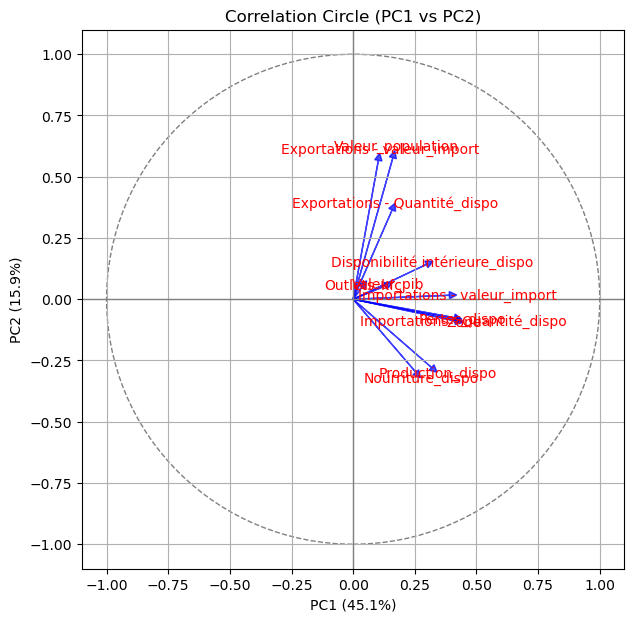

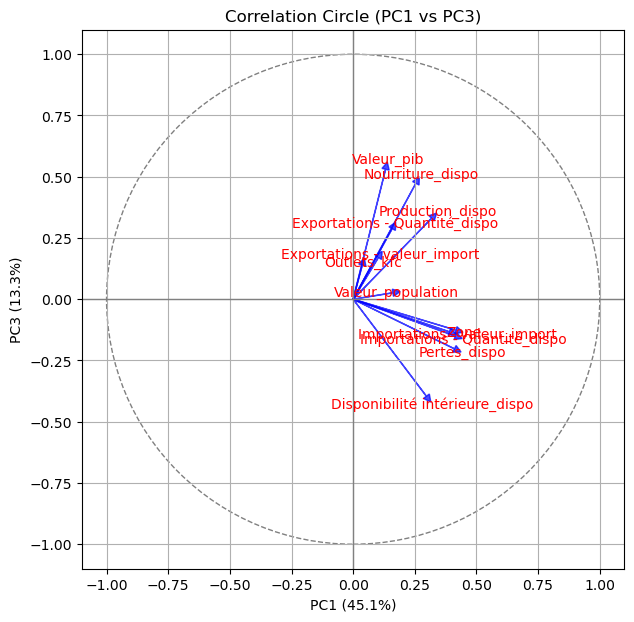

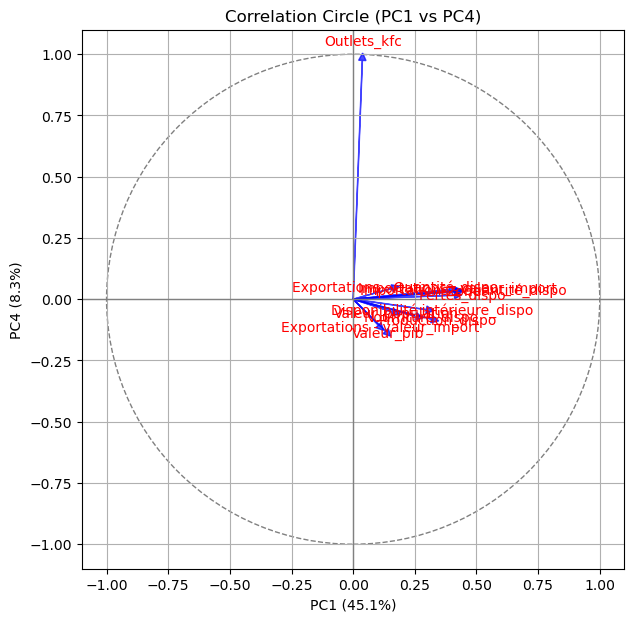

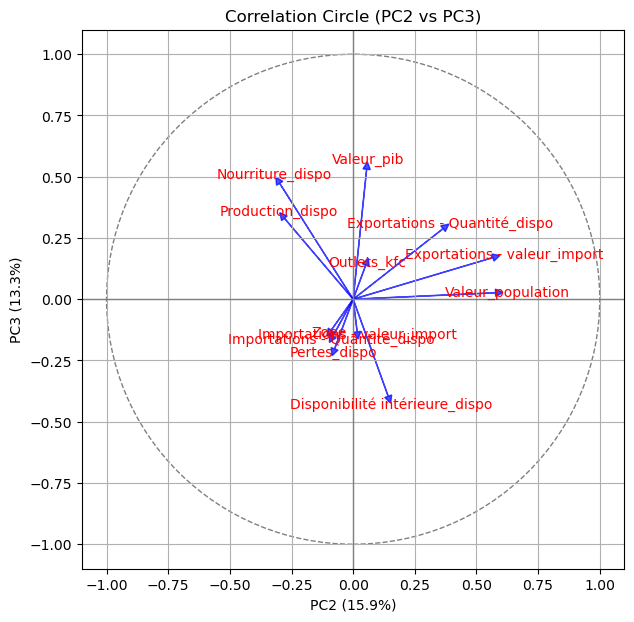

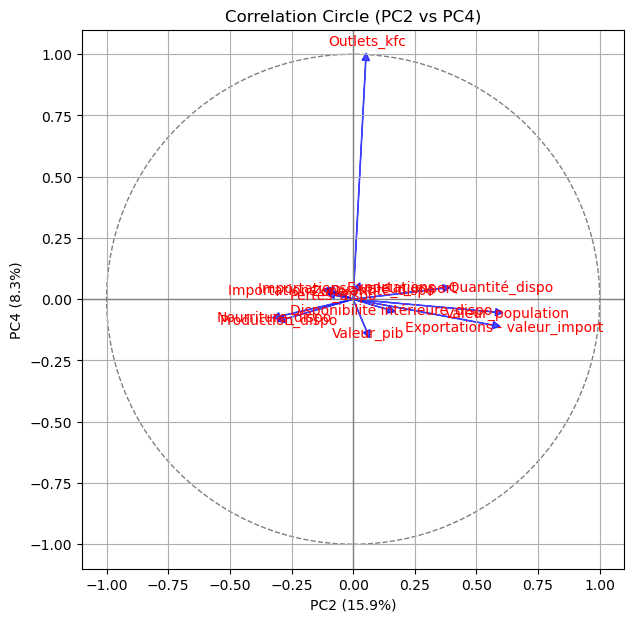

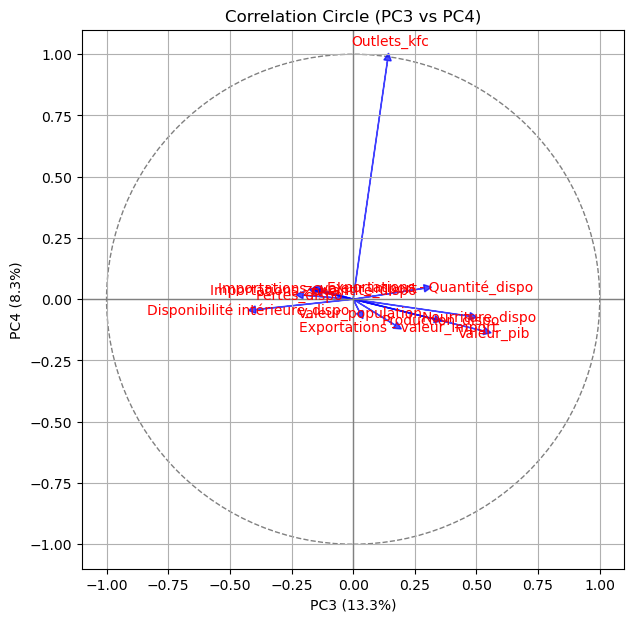

In [52]:
import matplotlib.pyplot as plt
import numpy as np

def plot_correlation_circle(pca, features, pcx=1, pcy=2):
    pcs = pca.components_
    plt.figure(figsize=(7,7))
    circle = plt.Circle((0,0), 1, color='gray', fill=False, linestyle='--')
    plt.gca().add_artist(circle)
    for i, (x, y) in enumerate(zip(pcs[pcx-1], pcs[pcy-1])):
        plt.arrow(0, 0, x, y, head_width=0.03, head_length=0.03, color='b', alpha=0.7)
        plt.text(x*1.08, y*1.08, features[i], color='r', ha='center', va='center')
    pcx_name = f"PC{pcx}"
    pcy_name = f"PC{pcy}"
    plt.xlabel(f'{pcx_name} ({pca.explained_variance_ratio_[pcx-1]*100:.1f}%)')
    plt.ylabel(f'{pcy_name} ({pca.explained_variance_ratio_[pcy-1]*100:.1f}%)')
    plt.title(f'Correlation Circle ({pcx_name} vs {pcy_name})')
    plt.xlim(-1.1, 1.1)
    plt.ylim(-1.1, 1.1)
    plt.grid()
    plt.axhline(0, color='grey', lw=1)
    plt.axvline(0, color='grey', lw=1)
    plt.show()

# Only use the 4 most prominent components
n_components_to_plot = 4
for i in range(1, n_components_to_plot):
    for j in range(i+1, n_components_to_plot+1):
        plot_correlation_circle(pca, features, pcx=i, pcy=j)

### tests

In [53]:
df.index= df['Zone']

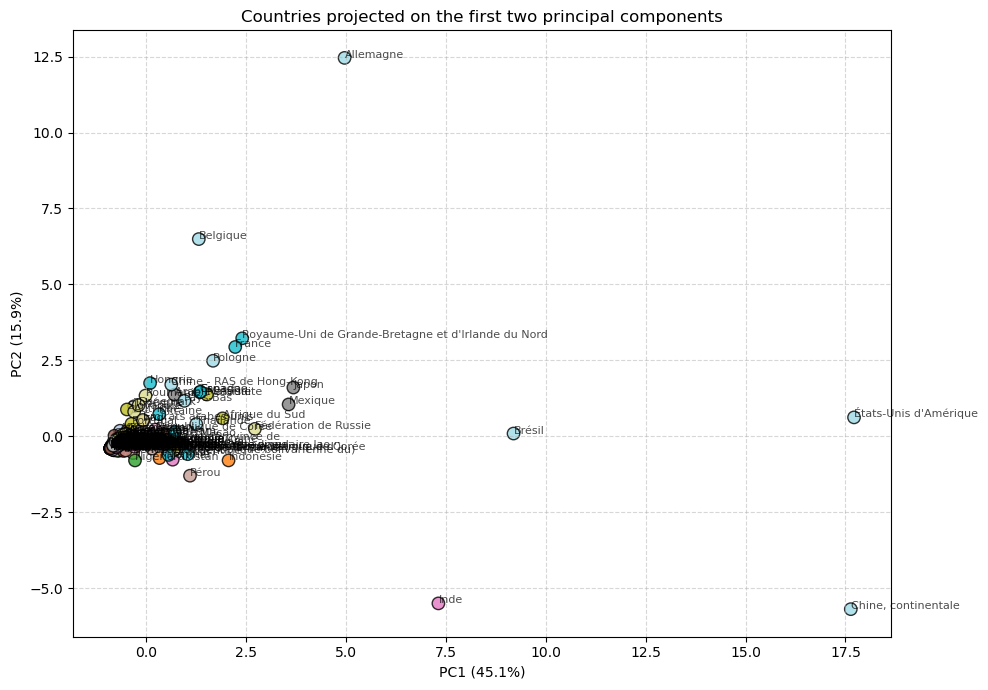

In [54]:
import matplotlib.pyplot as plt

# Scatter plot of countries on the first two principal components
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=df.index.factorize()[0],  # color by country (Zone)
    cmap='tab20', s=80, alpha=0.8, edgecolor='k'
)
for i, country in enumerate(df.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], country, fontsize=8, alpha=0.7)

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
plt.title('Countries projected on the first two principal components')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

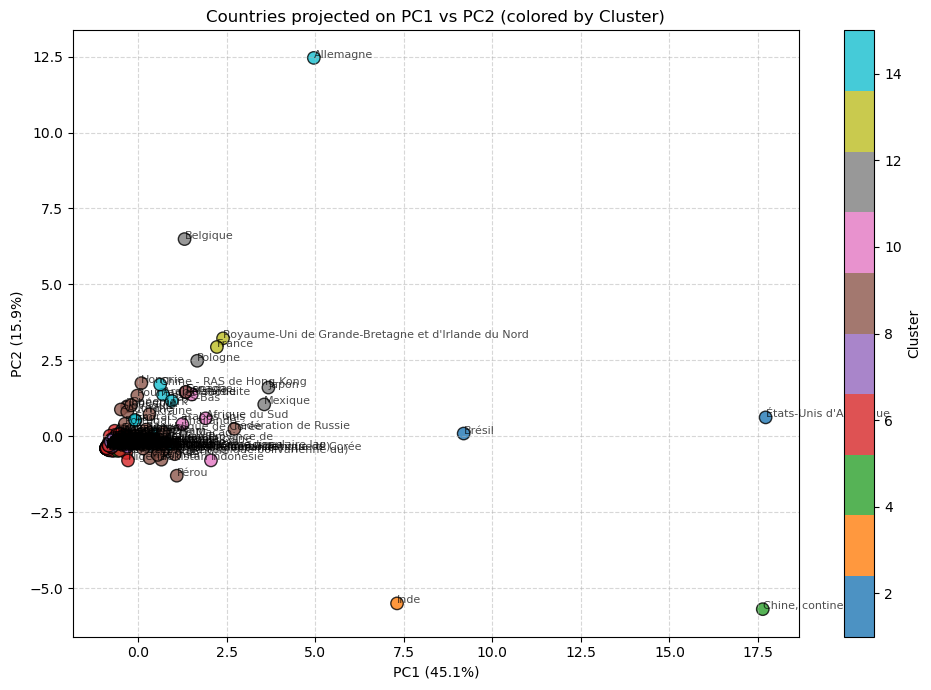

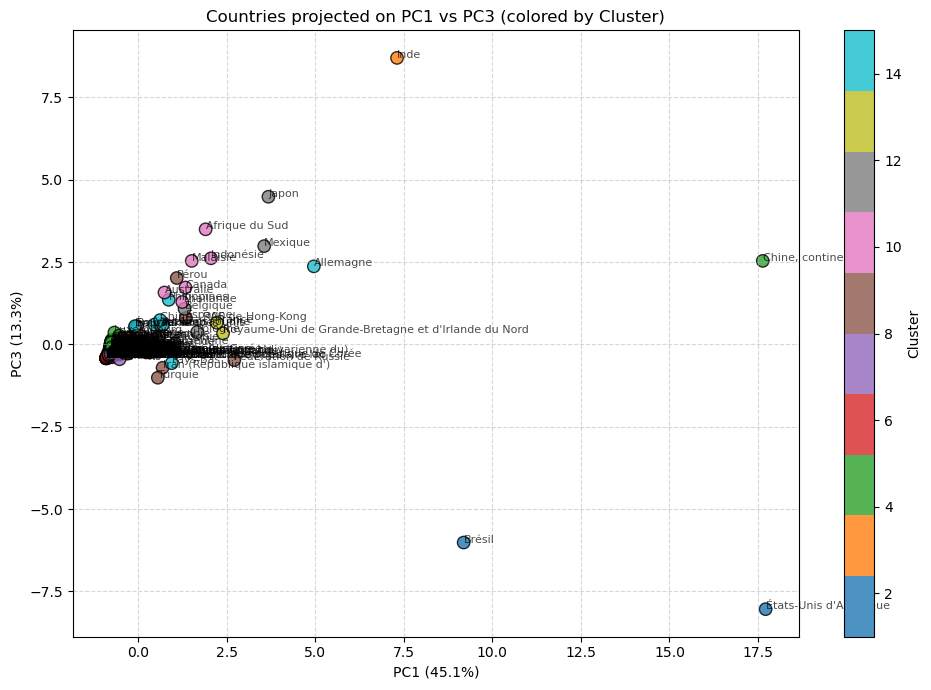

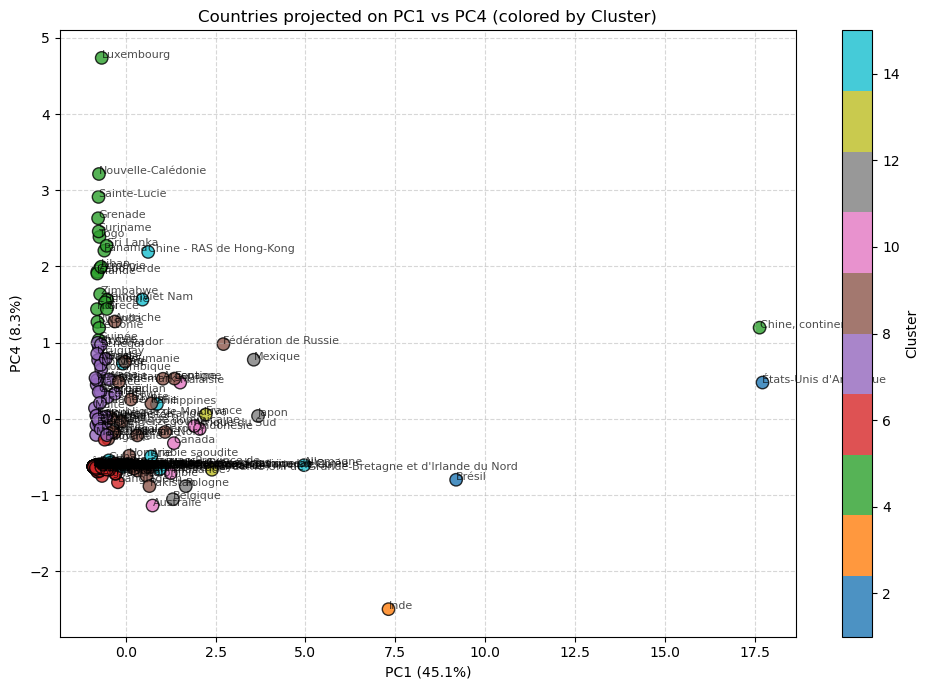

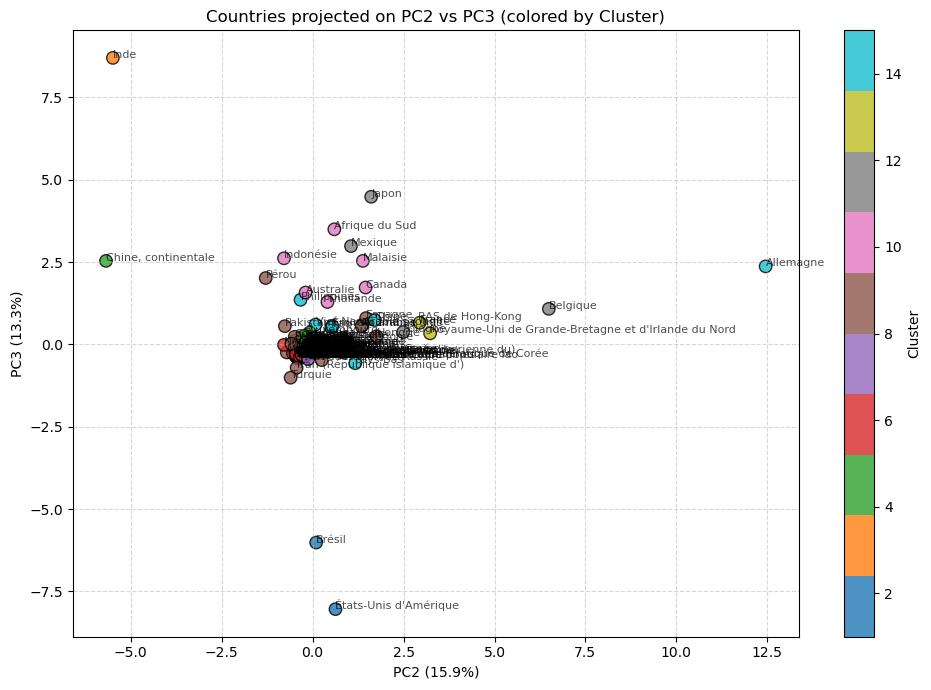

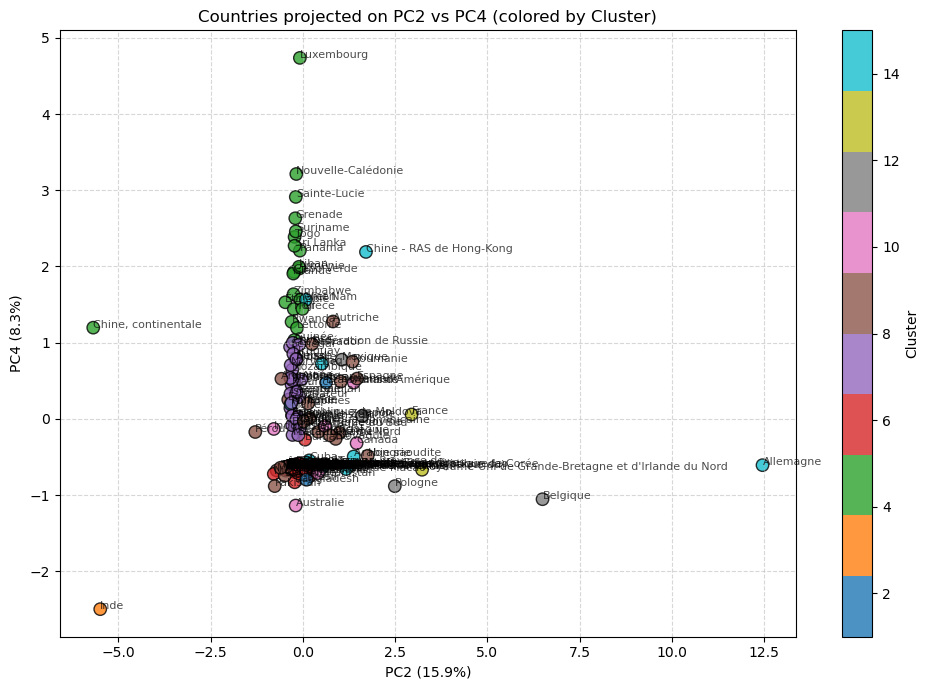

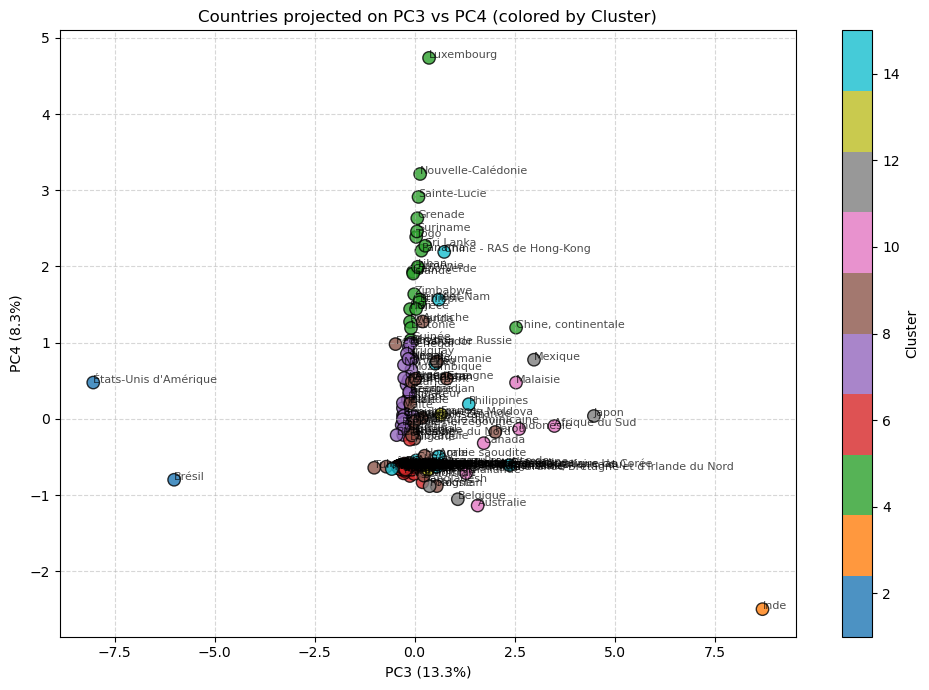

In [55]:
import matplotlib.pyplot as plt

# Scatter plots for all unique pairs among the first 4 principal components, colored by cluster
n_components_to_plot = 4
component_names = [f'PC{i+1}' for i in range(n_components_to_plot)]

for i in range(n_components_to_plot):
    for j in range(i+1, n_components_to_plot):
        plt.figure(figsize=(10, 7))
        scatter = plt.scatter(
            X_pca[:, i], X_pca[:, j],
            c=df['Cluster'], cmap='tab10', s=80, alpha=0.8, edgecolor='k'
        )
        for k, country in enumerate(df.index):
            plt.text(X_pca[k, i], X_pca[k, j], country, fontsize=8, alpha=0.7)
        plt.xlabel(f'{component_names[i]} ({pca.explained_variance_ratio_[i]*100:.1f}%)')
        plt.ylabel(f'{component_names[j]} ({pca.explained_variance_ratio_[j]*100:.1f}%)')
        plt.title(f'Countries projected on {component_names[i]} vs {component_names[j]} (colored by Cluster)')
        cbar = plt.colorbar(scatter, label='Cluster')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

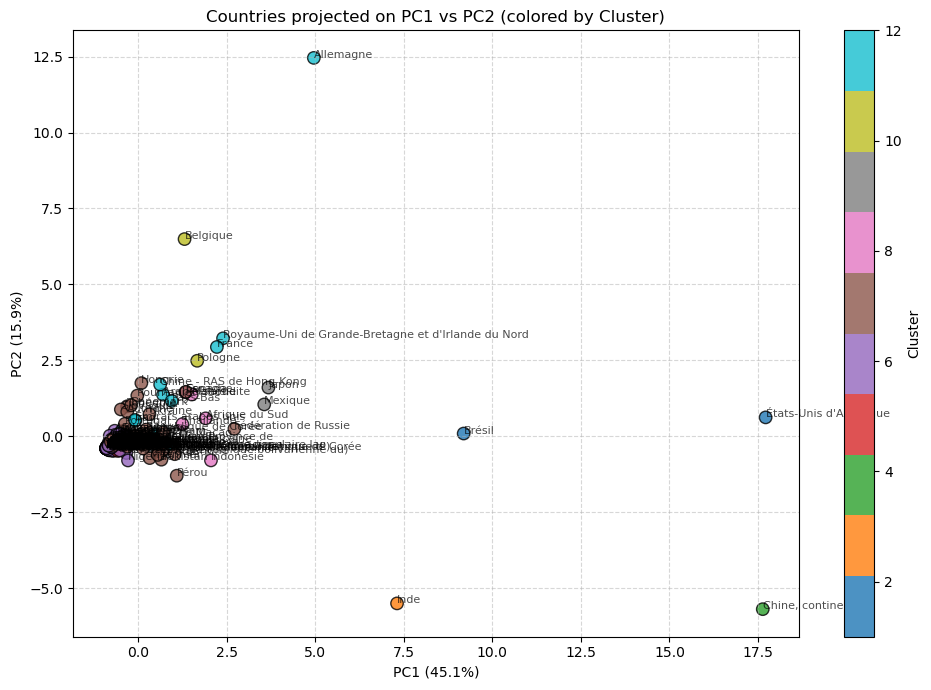

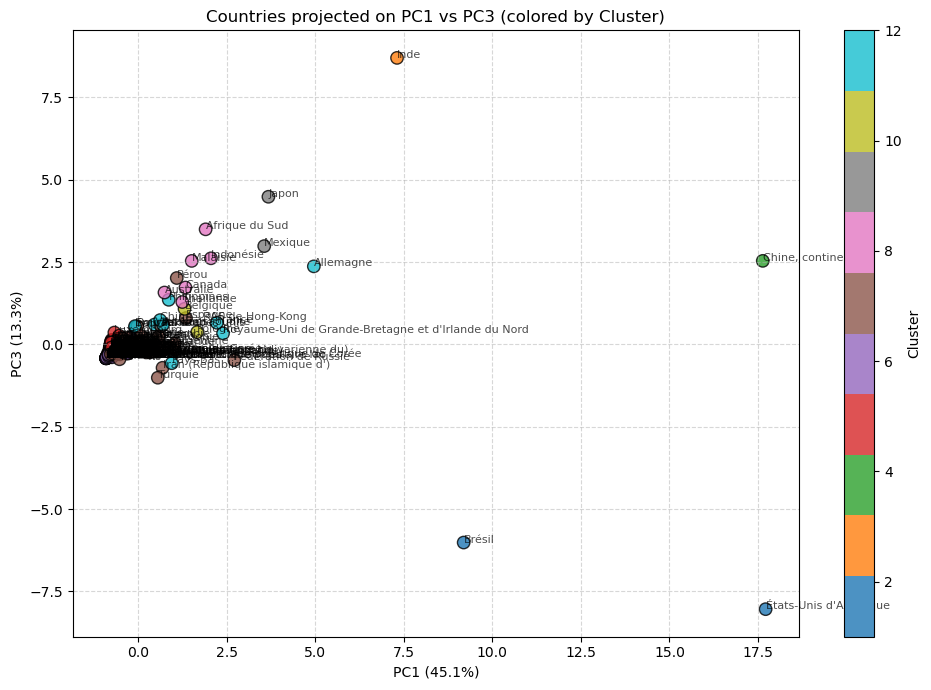

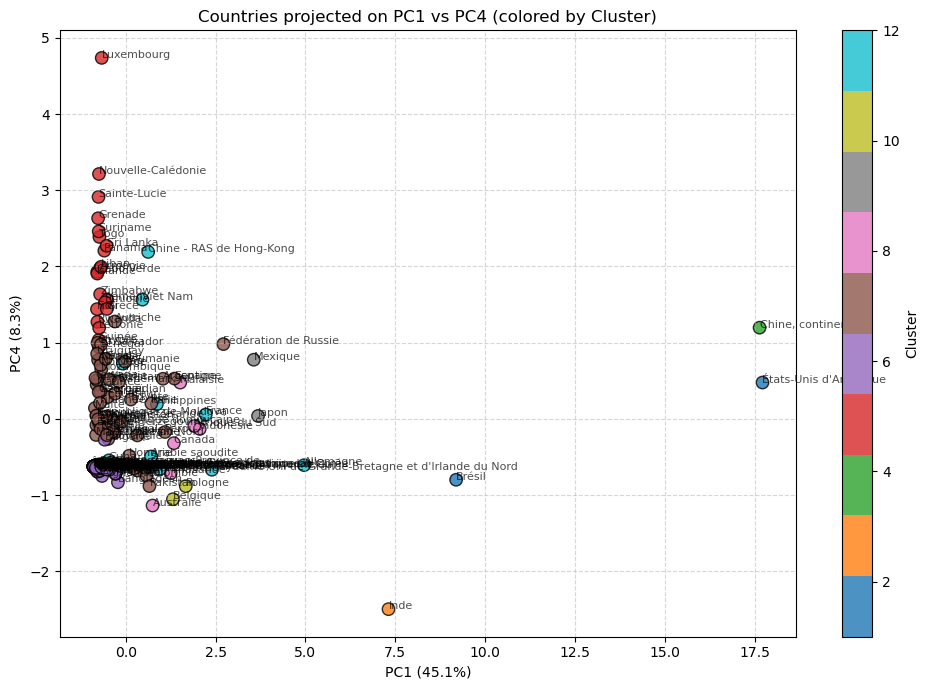

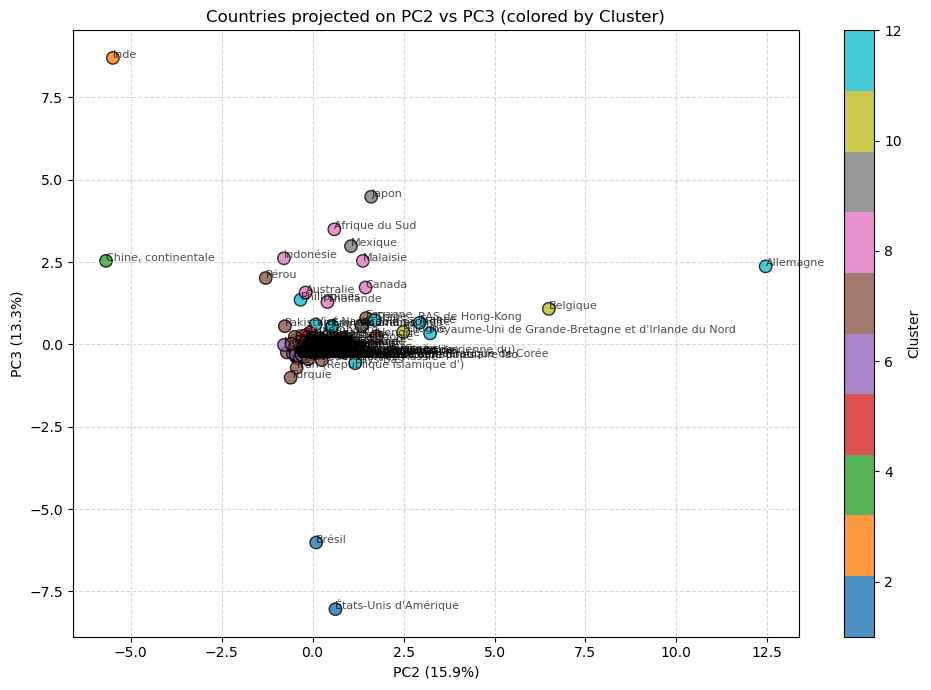

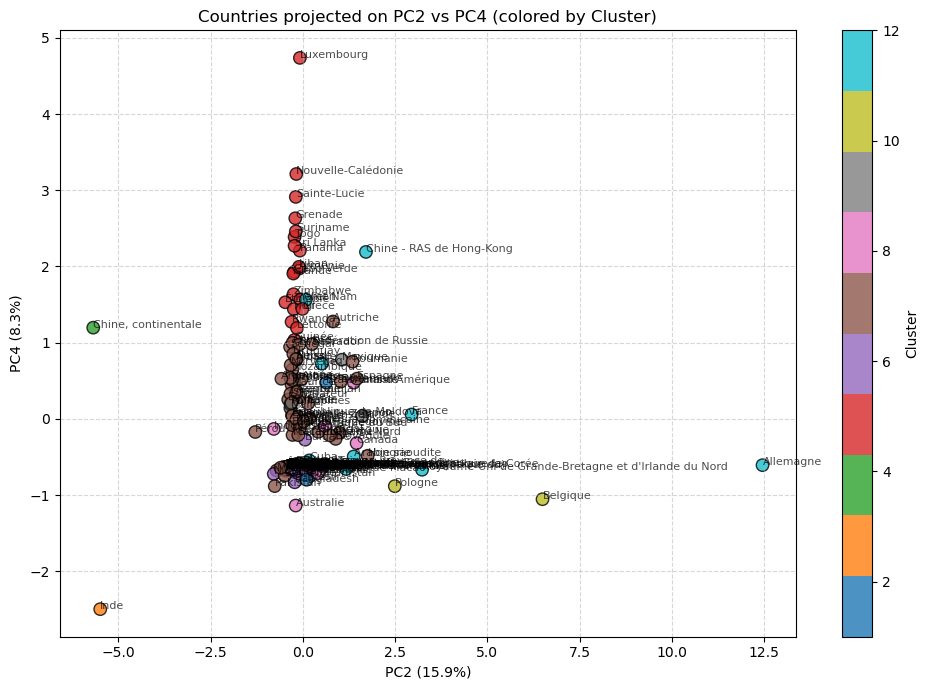

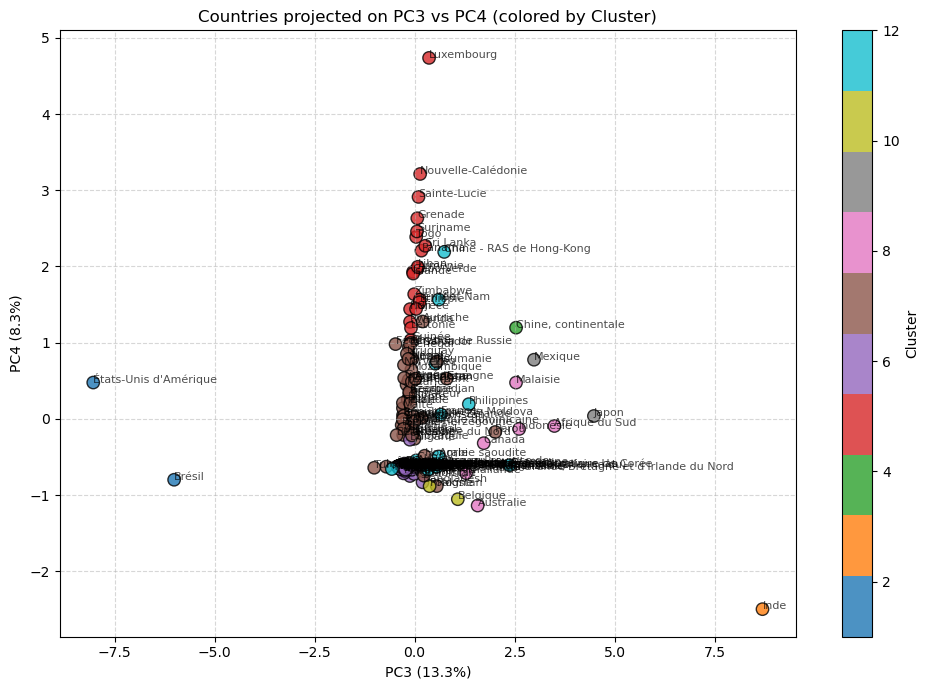

In [56]:
import matplotlib.pyplot as plt

# Scatter plots for all unique pairs among the first 4 principal components, colored by cluster
n_components_to_plot = 4
component_names = [f'PC{i+1}' for i in range(n_components_to_plot)]

for i in range(n_components_to_plot):
    for j in range(i+1, n_components_to_plot):
        plt.figure(figsize=(10, 7))
        scatter = plt.scatter(
            X_pca[:, i], X_pca[:, j],
            c=df['Cluster_x'], cmap='tab10', s=80, alpha=0.8, edgecolor='k'
        )
        for k, country in enumerate(df.index):
            plt.text(X_pca[k, i], X_pca[k, j], country, fontsize=8, alpha=0.7)
        plt.xlabel(f'{component_names[i]} ({pca.explained_variance_ratio_[i]*100:.1f}%)')
        plt.ylabel(f'{component_names[j]} ({pca.explained_variance_ratio_[j]*100:.1f}%)')
        plt.title(f'Countries projected on {component_names[i]} vs {component_names[j]} (colored by Cluster)')
        cbar = plt.colorbar(scatter, label='Cluster')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

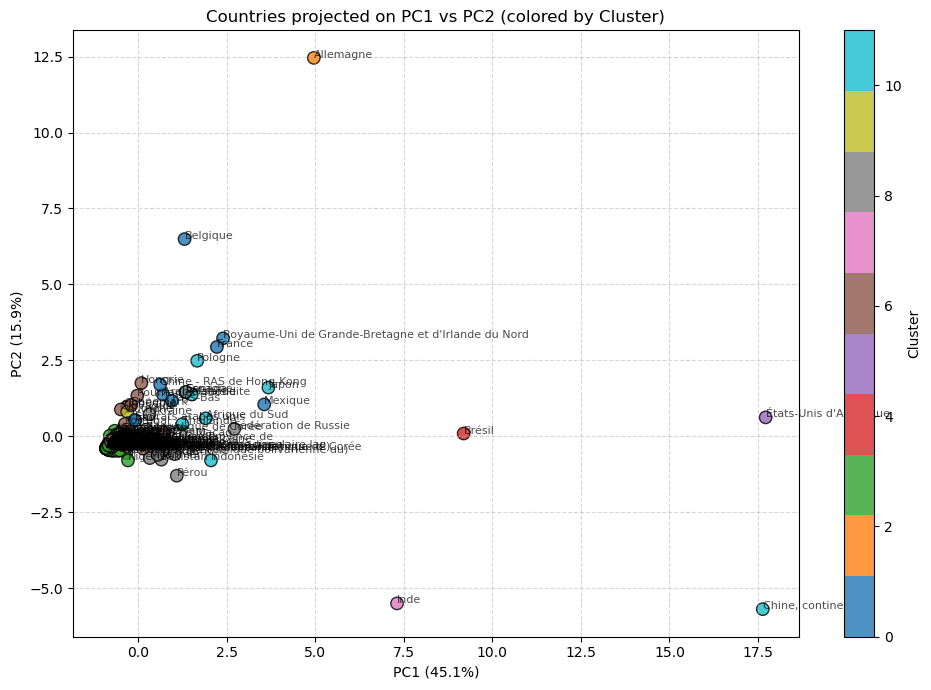

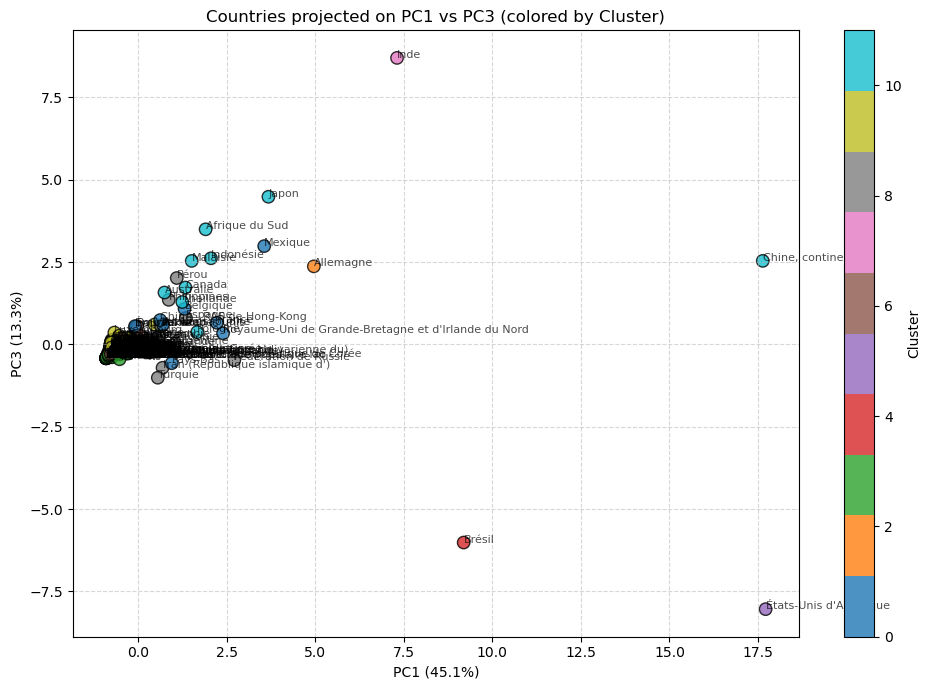

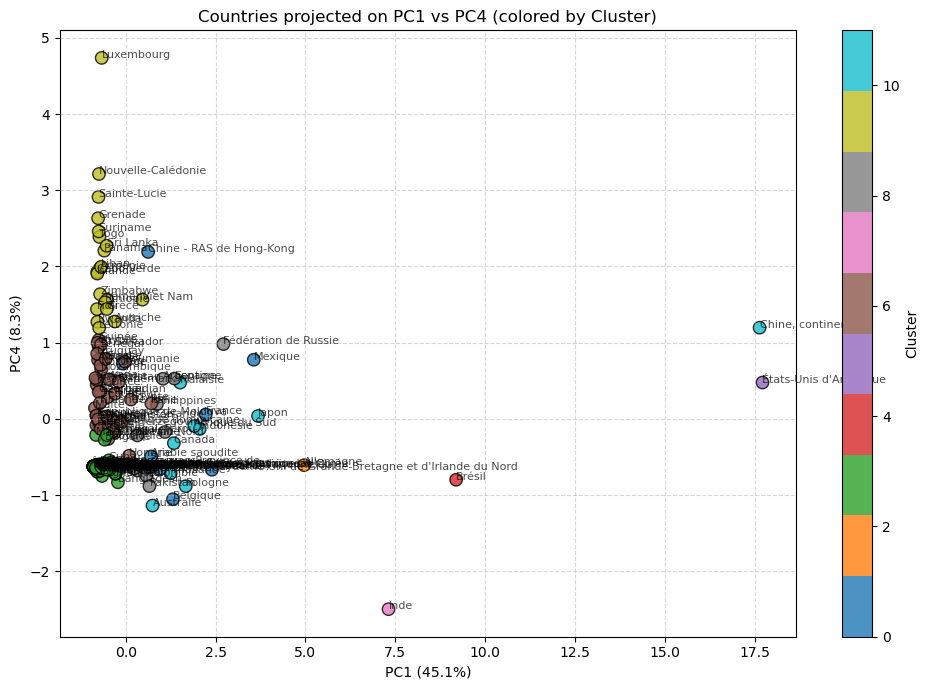

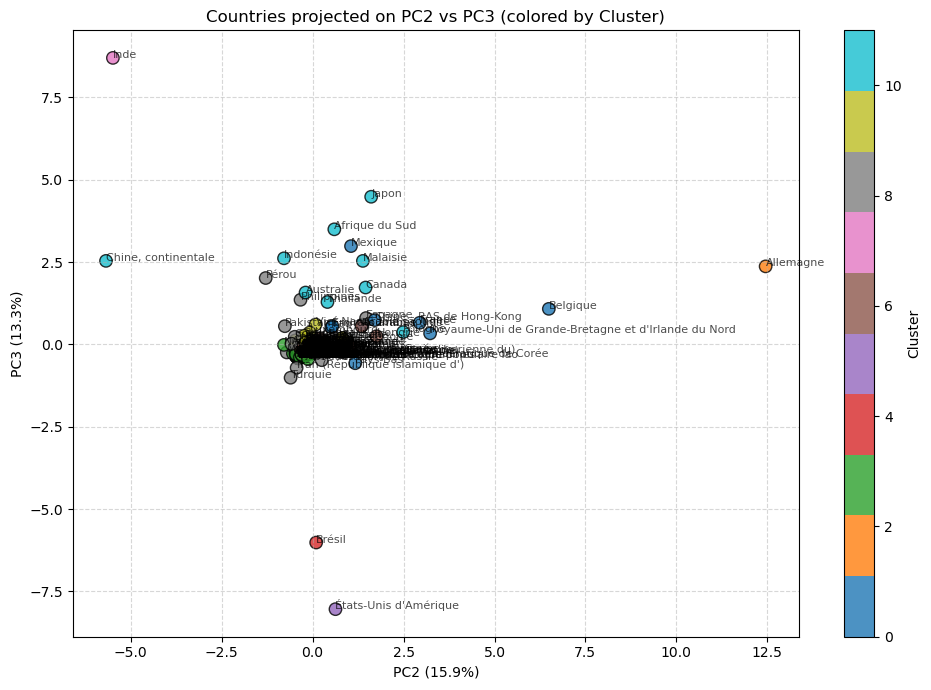

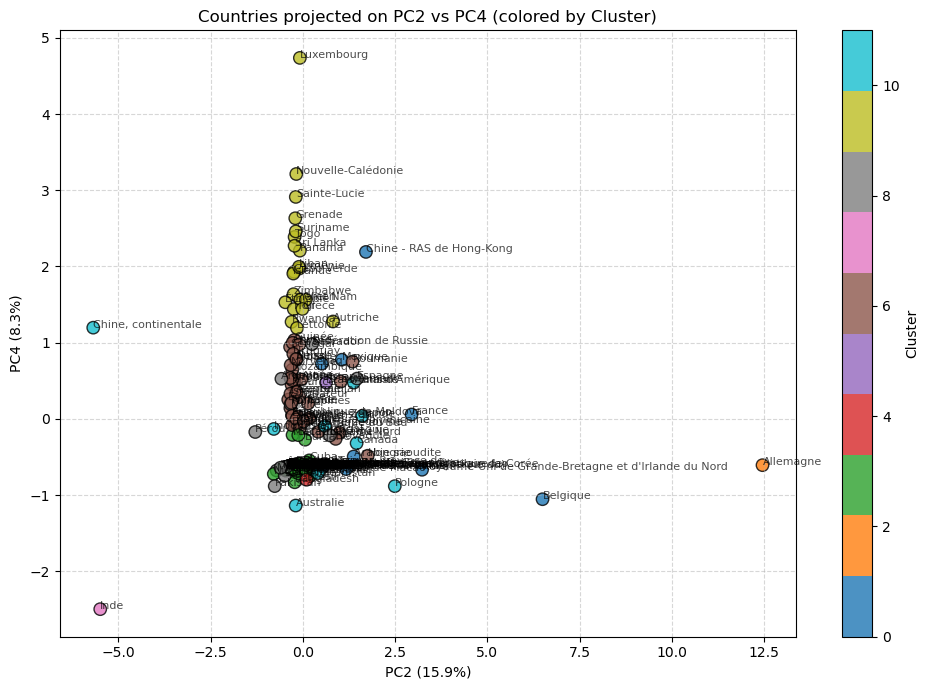

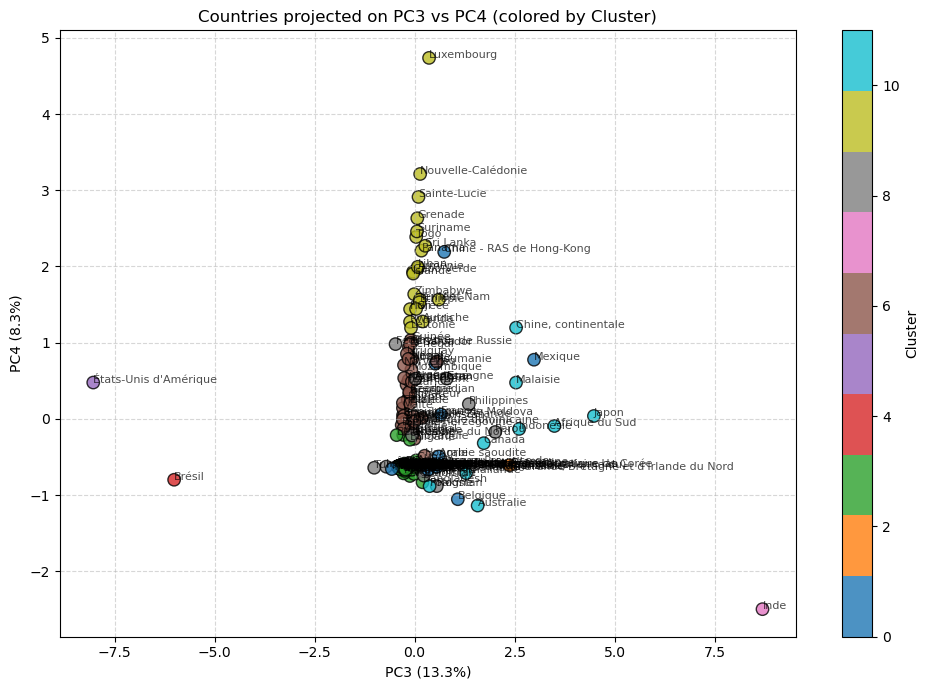

In [57]:
import matplotlib.pyplot as plt

# Scatter plots for all unique pairs among the first 4 principal components, colored by cluster
n_components_to_plot = 4
component_names = [f'PC{i+1}' for i in range(n_components_to_plot)]

for i in range(n_components_to_plot):
    for j in range(i+1, n_components_to_plot):
        plt.figure(figsize=(10, 7))
        scatter = plt.scatter(
            X_pca[:, i], X_pca[:, j],
            c=df['Cluster_kmedoids'], cmap='tab10', s=80, alpha=0.8, edgecolor='k'
        )
        for k, country in enumerate(df.index):
            plt.text(X_pca[k, i], X_pca[k, j], country, fontsize=8, alpha=0.7)
        plt.xlabel(f'{component_names[i]} ({pca.explained_variance_ratio_[i]*100:.1f}%)')
        plt.ylabel(f'{component_names[j]} ({pca.explained_variance_ratio_[j]*100:.1f}%)')
        plt.title(f'Countries projected on {component_names[i]} vs {component_names[j]} (colored by Cluster)')
        cbar = plt.colorbar(scatter, label='Cluster')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

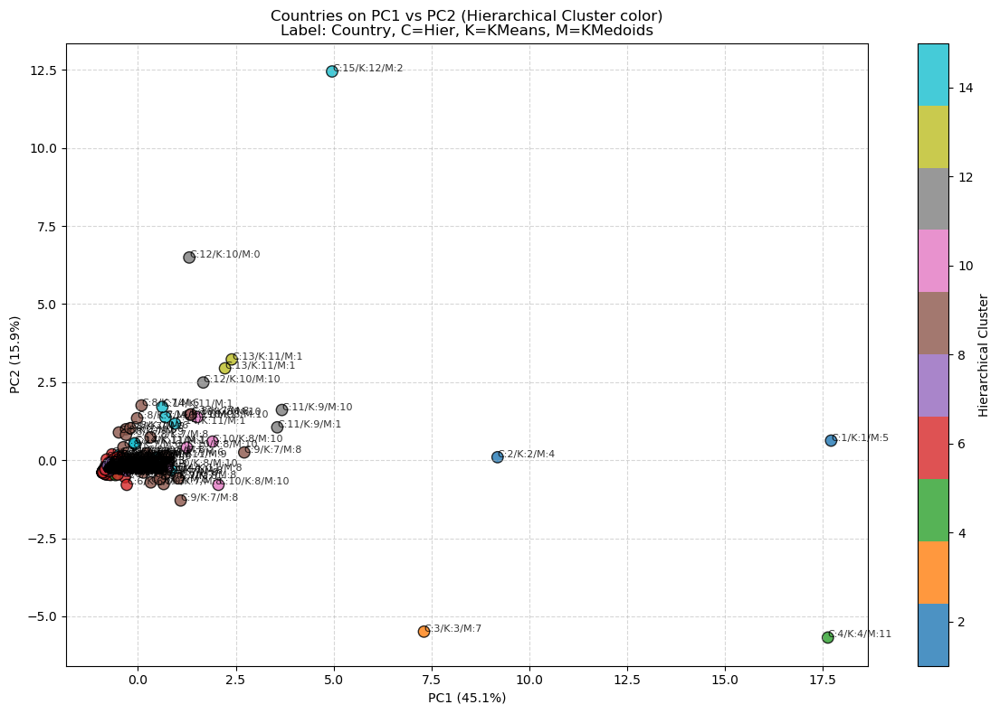

In [58]:
import matplotlib.pyplot as plt

# Scatter plot of countries on the first two principal components, colored by hierarchical cluster
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=df['Cluster'], cmap='tab10', s=80, alpha=0.8, edgecolor='k'
)
for i, country in enumerate(df.index):
    plt.text(
        X_pca[i, 0], X_pca[i, 1],
        f"C:{df['Cluster'].iloc[i]}/K:{df['Cluster_x'].iloc[i]}/M:{df['Cluster_kmedoids'].iloc[i]}",
        fontsize=8, alpha=0.8
    )

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
plt.title('Countries on PC1 vs PC2 (Hierarchical Cluster color)\nLabel: Country, C=Hier, K=KMeans, M=KMedoids')
plt.colorbar(scatter, label='Hierarchical Cluster')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

####  standard deviations 3

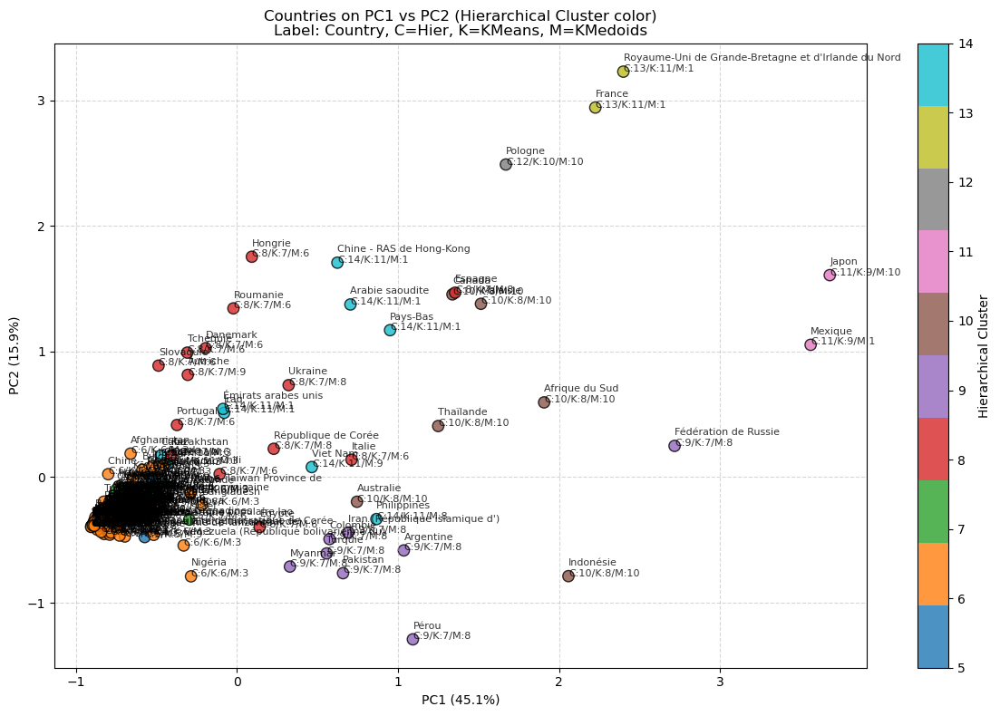

In [59]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the mean and standard deviation for PC1 and PC2
pc1 = X_pca[:, 0]
pc2 = X_pca[:, 1]
mean1, std1 = np.mean(pc1), np.std(pc1)
mean2, std2 = np.mean(pc2), np.std(pc2)

# Define a mask to keep only points within 3 standard deviations (adjust as needed)
mask = (
    (np.abs(pc1 - mean1) < 3 * std1) &
    (np.abs(pc2 - mean2) < 3 * std2)
)

# Filter data
pc1_filt = pc1[mask]
pc2_filt = pc2[mask]
df_filt = df.iloc[mask]

plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    pc1_filt, pc2_filt,
    c=df_filt['Cluster'], cmap='tab10', s=80, alpha=0.8, edgecolor='k'
)

for i, country in enumerate(df_filt.index):
    plt.text(
        pc1_filt[i], pc2_filt[i],
        f"{country}\nC:{df_filt['Cluster'].iloc[i]}/K:{df_filt['Cluster_x'].iloc[i]}/M:{df_filt['Cluster_kmedoids'].iloc[i]}",
        fontsize=8, alpha=0.8
    )

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
plt.title('Countries on PC1 vs PC2 (Hierarchical Cluster color)\nLabel: Country, C=Hier, K=KMeans, M=KMedoids')
plt.colorbar(scatter, label='Hierarchical Cluster')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

#### standard deviation 1

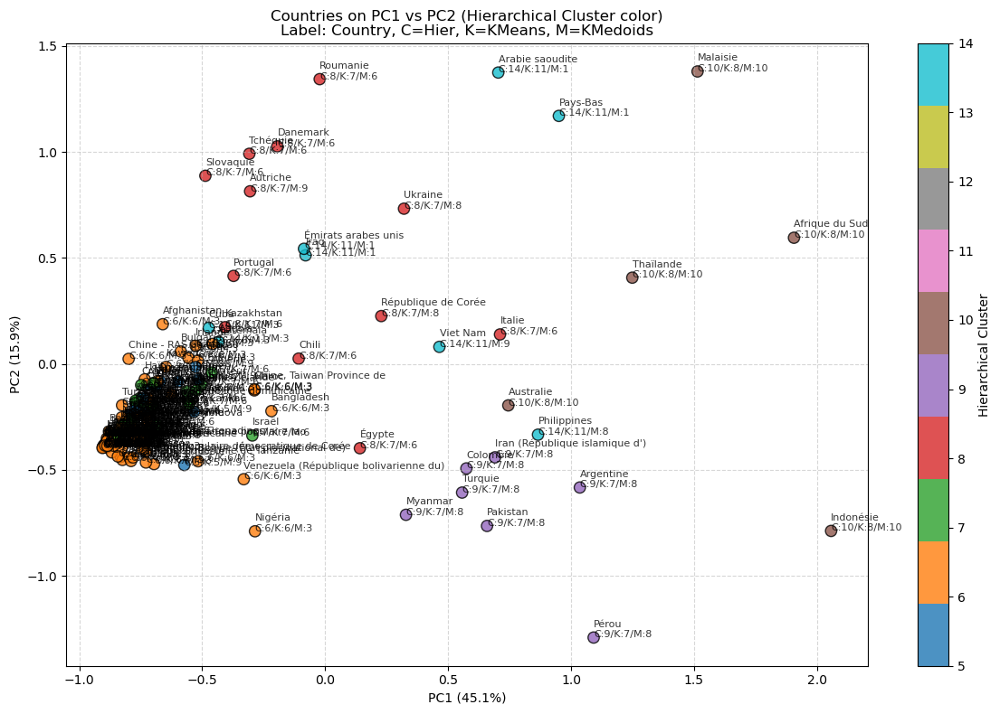

In [60]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the mean and standard deviation for PC1 and PC2
pc1 = X_pca[:, 0]
pc2 = X_pca[:, 1]
mean1, std1 = np.mean(pc1), np.std(pc1)
mean2, std2 = np.mean(pc2), np.std(pc2)

# Define a mask to keep only points within 1 standard deviations (adjust as needed)
mask = (
    (np.abs(pc1 - mean1) < 1 * std1) &
    (np.abs(pc2 - mean2) < 1 * std2)
)

# Filter data
pc1_filt = pc1[mask]
pc2_filt = pc2[mask]
df_filt = df.iloc[mask]

plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    pc1_filt, pc2_filt,
    c=df_filt['Cluster'], cmap='tab10', s=80, alpha=0.8, edgecolor='k'
)

for i, country in enumerate(df_filt.index):
    plt.text(
        pc1_filt[i], pc2_filt[i],
        f"{country}\nC:{df_filt['Cluster'].iloc[i]}/K:{df_filt['Cluster_x'].iloc[i]}/M:{df_filt['Cluster_kmedoids'].iloc[i]}",
        fontsize=8, alpha=0.8
    )

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
plt.title('Countries on PC1 vs PC2 (Hierarchical Cluster color)\nLabel: Country, C=Hier, K=KMeans, M=KMedoids')
plt.colorbar(scatter, label='Hierarchical Cluster')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

#### standard deviations 0.5

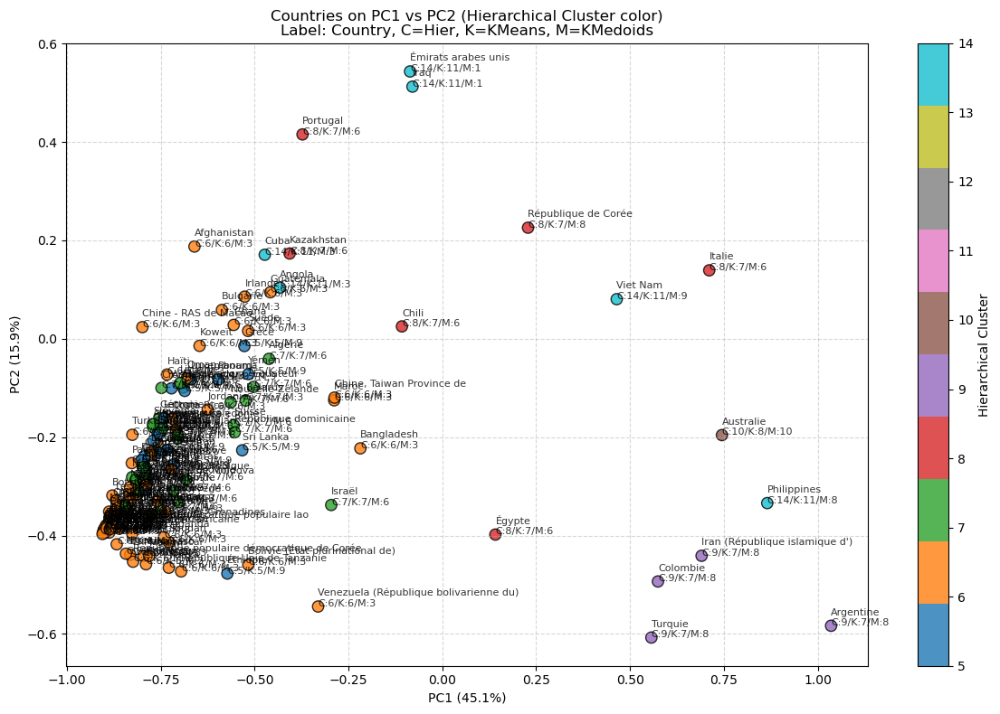

In [61]:
# Calculate the mean and standard deviation for PC1 and PC2
pc1 = X_pca[:, 0]
pc2 = X_pca[:, 1]
mean1, std1 = np.mean(pc1), np.std(pc1)
mean2, std2 = np.mean(pc2), np.std(pc2)

# Define a mask to keep only points within 1 standard deviations (adjust as needed)
mask = (
    (np.abs(pc1 - mean1) < 0.5 * std1) &
    (np.abs(pc2 - mean2) < 0.5 * std2)
)

# Filter data
pc1_filt = pc1[mask]
pc2_filt = pc2[mask]
df_filt = df.iloc[mask]

plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    pc1_filt, pc2_filt,
    c=df_filt['Cluster'], cmap='tab10', s=80, alpha=0.8, edgecolor='k'
)

for i, country in enumerate(df_filt.index):
    plt.text(
        pc1_filt[i], pc2_filt[i],
        f"{country}\nC:{df_filt['Cluster'].iloc[i]}/K:{df_filt['Cluster_x'].iloc[i]}/M:{df_filt['Cluster_kmedoids'].iloc[i]}",
        fontsize=8, alpha=0.8
    )

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
plt.title('Countries on PC1 vs PC2 (Hierarchical Cluster color)\nLabel: Country, C=Hier, K=KMeans, M=KMedoids')
plt.colorbar(scatter, label='Hierarchical Cluster')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

## Conclusion

### kmedoids


In [64]:
# select countries from kmedoids clusters that are in cluster 9 8 5 4 2
selected_clusters = [10, 8, 6, 5, 4, 2, 1]
selected_countries = df[df['Cluster_kmedoids'].isin(selected_clusters)]
# Display the selected countries
print("Selected countries from clusters 9, 8, 5, 4, and 0:")
for cluster in selected_clusters:
    print(f"Cluster {cluster}:")
    print(selected_countries.index[selected_countries['Cluster_kmedoids'] == cluster].tolist())
    print("\n")


Selected countries from clusters 9, 8, 5, 4, and 0:
Cluster 10:
['Indonésie', 'Japon', 'Australie', 'Malaisie', 'Afrique du Sud', 'Canada', 'Thaïlande', 'Pologne']


Cluster 8:
['Myanmar', 'Pérou', 'Philippines', 'Colombie', 'Pakistan', 'République de Corée', "Iran (République islamique d')", 'Fédération de Russie', 'Argentine', 'Espagne', 'Ukraine', 'Turquie']


Cluster 6:
['Sénégal', 'République de Moldova', 'Népal', 'Guinée', 'Maurice', 'Albanie', 'Équateur', 'Algérie', 'Azerbaïdjan', 'Mozambique', 'Norvège', 'Malte', 'Kirghizistan', 'Guyana', 'Chypre', 'Égypte', 'El Salvador', 'Israël', 'Uruguay', 'Suisse', 'Géorgie', 'République dominicaine', 'Kazakhstan', 'Serbie', 'Bosnie-Herzégovine', 'Estonie', 'Finlande', 'Croatie', 'Nouvelle-Zélande', 'Tchéquie', 'Slovénie', 'Slovaquie', 'Portugal', 'Lituanie', 'Roumanie', 'Chili', 'Danemark', 'Italie', 'Hongrie']


Cluster 5:
["États-Unis d'Amérique"]


Cluster 4:
['Brésil']


Cluster 2:
['Allemagne']


Cluster 1:
['Iraq', 'Mexique', 'Arabi

### kmeans

In [65]:
# select countries from kmeans clusters that are in cluster 1 4 9 12
selected_clusters_kmeans = [1, 12, 2 , 10, 11, 9, 7, 8]
selected_countries_kmeans = df[df['Cluster_x'].isin(selected_clusters_kmeans)]
# Display the selected countries
print("Selected countries from clusters 1, 4, 9, and 2:")
for cluster in selected_clusters_kmeans:
    print(f"Cluster {cluster}:")
    print(selected_countries_kmeans.index[selected_countries_kmeans['Cluster'] == cluster].tolist())
    print("\n")

Selected countries from clusters 1, 4, 9, and 2:
Cluster 1:
["États-Unis d'Amérique"]


Cluster 12:
['Belgique', 'Pologne']


Cluster 2:
['Brésil']


Cluster 10:
['Indonésie', 'Australie', 'Malaisie', 'Afrique du Sud', 'Canada', 'Thaïlande']


Cluster 11:
['Mexique', 'Japon']


Cluster 9:
['Myanmar', 'Pérou', 'Colombie', 'Pakistan', "Iran (République islamique d')", 'Fédération de Russie', 'Argentine', 'Turquie']


Cluster 7:
['Sénégal', 'République de Moldova', 'Népal', 'Maurice', 'Albanie', 'Équateur', 'Algérie', 'Azerbaïdjan', 'Mozambique', 'Norvège', 'Malte', 'Kirghizistan', 'Guyana', 'Chypre', 'Macédoine du Nord', 'El Salvador', 'Israël', 'Uruguay', 'Suisse', 'Géorgie', 'République dominicaine', 'Serbie', 'Bosnie-Herzégovine', 'Estonie', 'Finlande', 'Croatie', 'Nouvelle-Zélande', 'Slovénie', 'Lituanie', 'Bélarus']


Cluster 8:
['Égypte', 'République de Corée', 'Kazakhstan', 'Tchéquie', 'Slovaquie', 'Portugal', 'Roumanie', 'Autriche', 'Chili', 'Danemark', 'Italie', 'Hongrie', 'Espa

### hierarchical clustering

In [66]:
# select countries from hierarchical clusters that are in cluster 1 2 3 4 5
selected_clusters_hierarchical = [1, 2, 12, 13, 15, 11, 9, 10, 14]
selected_countries_hierarchical = df[df['Cluster'].isin(selected_clusters_hierarchical)]   
# Display the selected countries
print("Selected countries from clusters 1, 2, 3, 4, and 5:")
for cluster in selected_clusters_hierarchical:
    print(f"Cluster {cluster}:")
    print(selected_countries_hierarchical.index[selected_countries_hierarchical['Cluster'] == cluster].tolist())
    print("\n")
    

Selected countries from clusters 1, 2, 3, 4, and 5:
Cluster 1:
["États-Unis d'Amérique"]


Cluster 2:
['Brésil']


Cluster 12:
['Belgique', 'Pologne']


Cluster 13:
["Royaume-Uni de Grande-Bretagne et d'Irlande du Nord", 'France']


Cluster 15:
['Allemagne']


Cluster 11:
['Mexique', 'Japon']


Cluster 9:
['Myanmar', 'Pérou', 'Colombie', 'Pakistan', "Iran (République islamique d')", 'Fédération de Russie', 'Argentine', 'Turquie']


Cluster 10:
['Indonésie', 'Australie', 'Malaisie', 'Afrique du Sud', 'Canada', 'Thaïlande']


Cluster 14:
['Iraq', 'Cuba', 'Angola', 'Viet Nam', 'Philippines', 'Arabie saoudite', 'Émirats arabes unis', 'Chine - RAS de Hong-Kong', 'Pays-Bas']




## compare the different clusters 


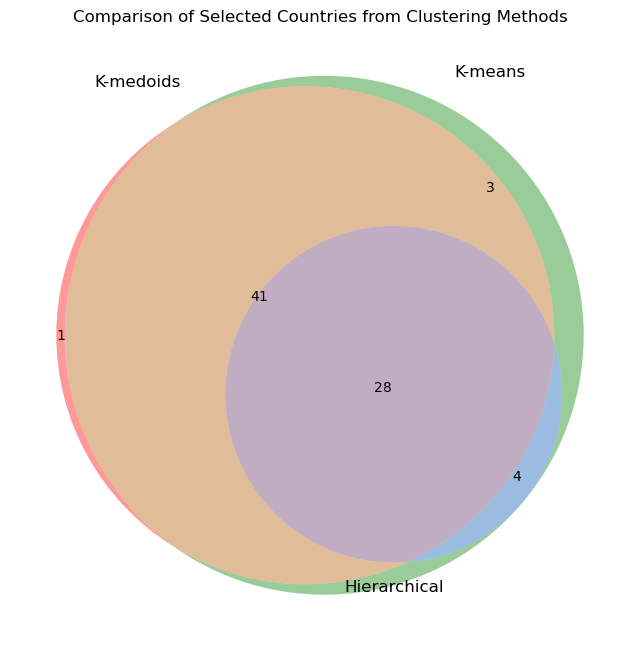

In [71]:
# compare the selected countries from the three clustering methods
import matplotlib.pyplot as plt
import numpy as np
# Create a Venn diagram to compare the selected countries from the three clustering methods
from matplotlib_venn import venn3
# Get the sets of countries for each clustering method
countries_kmedoids = set(selected_countries.index)
countries_kmeans = set(selected_countries_kmeans.index)
countries_hierarchical = set(selected_countries_hierarchical.index)
# Create the Venn diagram
plt.figure(figsize=(8, 8))
venn3([countries_kmedoids, countries_kmeans, countries_hierarchical],
      set_labels=('K-medoids', 'K-means', 'Hierarchical'))
plt.title('Comparison of Selected Countries from Clustering Methods')
plt.show()
  


In [72]:
# create a DataFrame for the selected countries
selected_countries_df = pd.DataFrame({
    'Country': selected_countries.index,
    'Cluster_kmedoids': selected_countries['Cluster_kmedoids'],
    'Cluster_x': selected_countries['Cluster_x'],
    'Cluster': selected_countries['Cluster']
})
# Display the DataFrame
print("Selected countries DataFrame:")
print(selected_countries_df)


Selected countries DataFrame:
                                     Country  Cluster_kmedoids  Cluster_x  \
Zone                                                                        
Sénégal                              Sénégal                 6          7   
République de Moldova  République de Moldova                 6          7   
Népal                                  Népal                 6          7   
Guinée                                Guinée                 6          5   
Maurice                              Maurice                 6          7   
...                                      ...               ...        ...   
Thaïlande                          Thaïlande                10          8   
Pologne                              Pologne                10         10   
Pays-Bas                            Pays-Bas                 1         11   
États-Unis d'Amérique  États-Unis d'Amérique                 5          1   
Brésil                                Brésil  

In [74]:
# show only the countries that are selected in all three clustering methods
common_countries = set(selected_countries.index) & set(selected_countries_kmeans.index) & set(selected_countries_hierarchical.index)
# Create a DataFrame for the common countries
common_countries_list = list(common_countries)

common_countries_df = pd.DataFrame({
    'Country': common_countries_list,
    'Cluster_kmedoids': selected_countries.loc[common_countries_list, 'Cluster_kmedoids'],
    'Cluster_x': selected_countries_kmeans.loc[common_countries_list, 'Cluster_x'],
    'Cluster': selected_countries_hierarchical.loc[common_countries_list, 'Cluster']
})

# Display the DataFrame
print("Common countries DataFrame:")
print(common_countries_df)

Common countries DataFrame:
                                                                                              Country  \
Zone                                                                                                    
Mexique                                                                                       Mexique   
Iraq                                                                                             Iraq   
Pologne                                                                                       Pologne   
Turquie                                                                                       Turquie   
Iran (République islamique d')                                         Iran (République islamique d')   
États-Unis d'Amérique                                                           États-Unis d'Amérique   
Colombie                                                                                     Colombie   
Argentine                  

In [77]:
# merge common_countries_df with the original df to get the features
common_countries_features_df = pd.merge(common_countries_df, df, left_on='Country', right_index=True)
# Display the DataFrame
print("Common countries features DataFrame:")
print(common_countries_features_df)
import matplotlib.pyplot as plt
import seaborn as sns
# Set the style of seaborn
sns.set(style="whitegrid")


Common countries features DataFrame:
                                                                                              Country  \
Zone                                                                                                    
Mexique                                                                                       Mexique   
Iraq                                                                                             Iraq   
Pologne                                                                                       Pologne   
Turquie                                                                                       Turquie   
Iran (République islamique d')                                         Iran (République islamique d')   
États-Unis d'Amérique                                                           États-Unis d'Amérique   
Colombie                                                                                     Colombie   
Argentine         

In [78]:
common_countries_features_df.head(5)

,Country,Cluster_kmedoids_x,Cluster_x_x,Cluster_x,Zone,Disponibilité intérieure_dispo,Exportations - Quantité_dispo,Importations - Quantité_dispo,Nourriture_dispo,Pertes_dispo,Production_dispo,Valeur_population,Exportations - valeur_import,Importations - valeur_import,Valeur_pib,Outlets_kfc,"Viande poids vif, poulet, totale_production",Cluster_y,Cluster_x_y,Cluster_kmedoids_y
Zone,,,,,,,,,,,,,,,,,,,,
Mexique,Mexique,1,9,11,Mexique,4.219000e+09,9.000000e+06,972000000.0,4.058000e+09,161000000.0,3.249000e+09,124777324.0,0.0,25837000.0,1.190721e+12,393.0,1.39655,11,9,1
Iraq,Iraq,1,11,14,Iraq,5.660000e+08,0.000000e+00,470000000.0,5.610000e+08,5000000.0,9.600000e+07,37552781.0,570000.0,2092000.0,1.872177e+11,0.0,1.09320,14,11,1
Pologne,Pologne,10,10,12,Pologne,1.156000e+09,1.025000e+09,55000000.0,1.150000e+09,27000000.0,2.351000e+09,37953180.0,19313000.0,106814000.0,5.246412e+11,315.0,0.44530,12,10,10
Turquie,Turquie,8,7,9,Turquie,1.674000e+09,4.290000e+08,3000000.0,1.674000e+09,0.0,2.192000e+09,81116450.0,0.0,0.0,0.000000e+00,0.0,0.00000,9,7,8
Iran (République islamique d'),Iran (République islamique d'),8,7,9,Iran (République islamique d'),2.220000e+09,4.500000e+07,6000000.0,2.220000e+09,0.0,2.174000e+09,80673883.0,9524000.0,9511000.0,5.037100e+11,0.0,0.00000,9,7,8


In [86]:
# drop unnecessary columns
common_countries_features_df_clean = common_countries_features_df.drop(columns=['Cluster_kmedoids_y', 'Cluster_x_y', 'Cluster_y', 'Country', 'Zone', 'Cluster_kmedoids_x', 'Cluster_x_x', 'Cluster_x' ])

In [87]:
common_countries_features_df_clean.head(5)

,Disponibilité intérieure_dispo,Exportations - Quantité_dispo,Importations - Quantité_dispo,Nourriture_dispo,Pertes_dispo,Production_dispo,Valeur_population,Exportations - valeur_import,Importations - valeur_import,Valeur_pib,Outlets_kfc,"Viande poids vif, poulet, totale_production"
Zone,,,,,,,,,,,,
Mexique,4.219000e+09,9.000000e+06,972000000.0,4.058000e+09,161000000.0,3.249000e+09,124777324.0,0.0,25837000.0,1.190721e+12,393.0,1.39655
Iraq,5.660000e+08,0.000000e+00,470000000.0,5.610000e+08,5000000.0,9.600000e+07,37552781.0,570000.0,2092000.0,1.872177e+11,0.0,1.09320
Pologne,1.156000e+09,1.025000e+09,55000000.0,1.150000e+09,27000000.0,2.351000e+09,37953180.0,19313000.0,106814000.0,5.246412e+11,315.0,0.44530
Turquie,1.674000e+09,4.290000e+08,3000000.0,1.674000e+09,0.0,2.192000e+09,81116450.0,0.0,0.0,0.000000e+00,0.0,0.00000
Iran (République islamique d'),2.220000e+09,4.500000e+07,6000000.0,2.220000e+09,0.0,2.174000e+09,80673883.0,9524000.0,9511000.0,5.037100e+11,0.0,0.00000


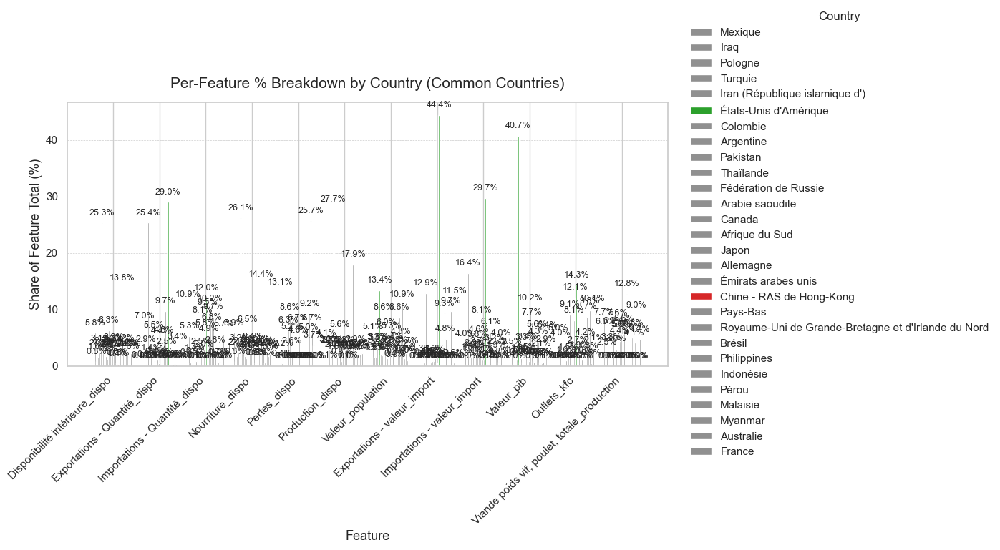

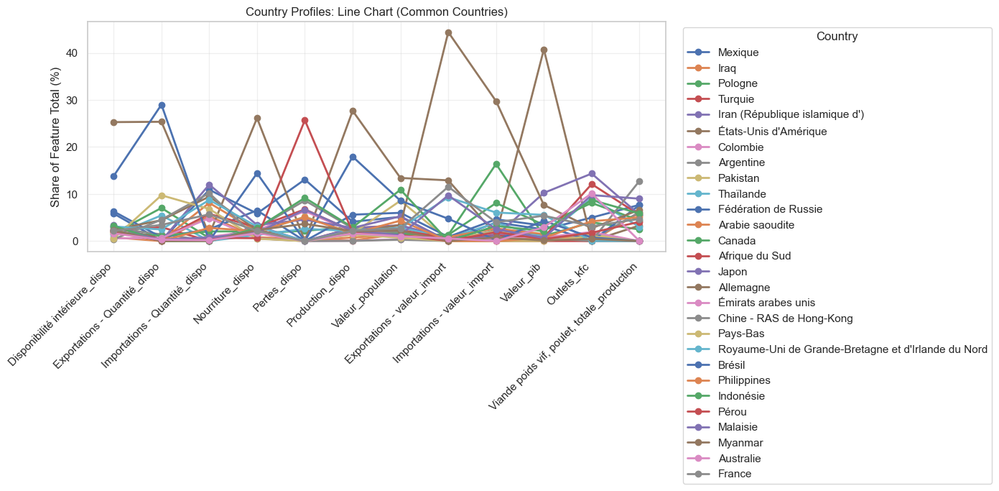

In [89]:
# create plot with percentage of each feature for each country
# Calculate the percentage of each feature for each country
percent_by_feature_common = common_countries_features_df_clean.div(common_countries_features_df_clean.sum(axis=0), axis=1) * 100

# Get the list of countries and features
countries_common = percent_by_feature_common.index.tolist()  # These are country names, not cluster numbers
features_common = percent_by_feature_common.columns.tolist()
x_common = np.arange(len(features_common))
width_common = 0.8 / len(countries_common)

fig, ax = plt.subplots(figsize=(14, 7))
ax.grid(axis='y', color='#CCCCCC', linestyle='--', linewidth=0.5)

for i, country in enumerate(countries_common):
    vals = percent_by_feature_common.loc[country].values
    colors = [
        '#2ca02c' if val == percent_by_feature_common[f].max() else
        '#d62728' if val == percent_by_feature_common[f].min() else
        '#909090'
        for val, f in zip(vals, features_common)
    ]
    offsets = x_common + (i - (len(countries_common)-1)/2) * width_common
    bars = ax.bar(offsets, vals, width=width_common, label=country, color=colors, edgecolor='white')
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, height + 1, f'{height:.1f}%', ha='center', va='bottom', fontsize=9)

ax.set_xticks(x_common)
ax.set_xticklabels(features_common, rotation=45, ha='right', fontsize=11)
ax.set_xlabel('Feature', fontsize=13)
ax.set_ylabel('Share of Feature Total (%)', fontsize=13)
ax.set_title('Per-Feature % Breakdown by Country (Common Countries)', fontsize=15, pad=15)
ax.legend(title='Country', bbox_to_anchor=(1.02, 0.5), loc='center left', frameon=False)
plt.tight_layout()
plt.show()

# create line chart with percentage of each feature for each country
fig, ax = plt.subplots(figsize=(14, 6))
for country in countries_common:
    ax.plot(
        features_common,
        percent_by_feature_common.loc[country],
        marker='o', linewidth=2, label=country
    )
ax.set_xticklabels(features_common, rotation=45, ha='right')
ax.set_ylabel('Share of Feature Total (%)')
ax.set_title('Country Profiles: Line Chart (Common Countries)')
ax.grid(alpha=0.3)
ax.legend(title='Country', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()